# The Time Series EDA for BTC/USD and ETH/USD Data

#### Inporting libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython import get_ipython
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')
import re
import datetime
import pyarrow as pa #faster than pandas


#### Loading the data


In [2]:
main_btc_df = pd.read_csv("Bitstamp_BTCUSD_1h.csv")
main_eth_df = pd.read_csv("Bitstamp_ETHUSD_1h.csv")

In [3]:
prefix = 'btc_'
prefix1 = 'eth_'
main_btc_df = main_btc_df.add_prefix(prefix)
main_eth_df = main_eth_df.add_prefix(prefix1)

#### EDA:

In [4]:
main_btc_df

,btc_unix,btc_date,btc_symbol,btc_open,btc_high,btc_low,btc_close,btc_Volume BTC,btc_Volume USD
0,1686528000,12/6/23 0:00,BTC/USD,25940.00,25946.00,25920.00,25930.00,3.151708e+00,8.172379e+04
1,1686524400,11/6/23 23:00,BTC/USD,25904.00,25948.00,25833.00,25941.00,3.278122e+01,8.503778e+05
2,1686520800,11/6/23 22:00,BTC/USD,26060.00,26083.00,25769.00,25899.00,1.549970e+02,4.014268e+06
3,1686517200,11/6/23 21:00,BTC/USD,26139.00,26152.00,25993.00,26060.00,3.235978e+01,8.432957e+05
4,1686513600,11/6/23 20:00,BTC/USD,26048.00,26209.00,26048.00,26139.00,8.192891e+01,2.141540e+06
...,...,...,...,...,...,...,...,...,...
44486,1526378400,15/5/18 10:00,BTC/USD,8708.32,8865.00,8695.11,8795.90,1.110127e+07,1.260690e+03
44487,1526374800,15/5/18 9:00,BTC/USD,8728.49,8754.40,8701.35,8708.32,1.593992e+06,1.826200e+02
44488,1526371200,15/5/18 8:00,BTC/USD,8739.00,8750.27,8660.53,8728.49,7.986063e+06,9.177900e+02
44489,1526367600,15/5/18 7:00,BTC/USD,8740.99,8766.00,8721.11,8739.00,2.390399e+06,2.735800e+02


#### Checking whether the both csv data can be merged together

In [5]:
# Assuming df1 and df2 are the two datasets with date columns

# Convert date columns to datetime type if they are not already in datetime format
main_btc_df['btc_date'] = pd.to_datetime(main_btc_df['btc_date'])
main_eth_df['eth_date'] = pd.to_datetime(main_eth_df['eth_date'])

# Check if the date columns are identical
if (main_btc_df['btc_date'] == main_eth_df['eth_date']).all():
    print("The date columns are identical.")
else:
    print("The date columns are not identical.")

The date columns are identical.


In [6]:
main_eth_df

,eth_unix,eth_date,eth_symbol,eth_open,eth_high,eth_low,eth_close,eth_Volume ETH,eth_Volume USD
0,1686528000,2023-12-06 00:00:00,ETH/USD,1753.40,1753.70,1751.30,1751.50,1.196840e+01,20962.65409
1,1686524400,2023-11-06 23:00:00,ETH/USD,1754.80,1756.70,1748.60,1753.40,7.430104e+01,130279.44450
2,1686520800,2023-11-06 22:00:00,ETH/USD,1765.10,1765.40,1742.80,1754.70,1.858214e+02,326060.78450
3,1686517200,2023-11-06 21:00:00,ETH/USD,1771.00,1771.90,1764.20,1764.40,6.760761e+01,119286.86630
4,1686513600,2023-11-06 20:00:00,ETH/USD,1763.60,1777.70,1763.60,1770.80,1.078005e+02,190893.08630
...,...,...,...,...,...,...,...,...,...
44486,1526378400,2018-05-15 10:00:00,ETH/USD,727.32,739.37,725.04,733.59,1.424388e+06,1943.15000
44487,1526374800,2018-05-15 09:00:00,ETH/USD,731.68,731.82,726.98,727.32,4.384113e+05,601.03000
44488,1526371200,2018-05-15 08:00:00,ETH/USD,733.82,734.92,721.58,731.68,2.860231e+06,3924.55000
44489,1526367600,2018-05-15 07:00:00,ETH/USD,733.00,735.99,730.45,733.82,2.594569e+05,353.82000


In [7]:
merged_df = main_eth_df.merge(main_btc_df, left_on='eth_date', right_on='btc_date')
merged_df

,eth_unix,eth_date,eth_symbol,eth_open,eth_high,eth_low,eth_close,eth_Volume ETH,eth_Volume USD,btc_unix,btc_date,btc_symbol,btc_open,btc_high,btc_low,btc_close,btc_Volume BTC,btc_Volume USD
0,1686528000,2023-12-06 00:00:00,ETH/USD,1753.40,1753.70,1751.30,1751.50,1.196840e+01,20962.65409,1686528000,2023-12-06 00:00:00,BTC/USD,25940.00,25946.00,25920.00,25930.00,3.151708e+00,8.172379e+04
1,1686524400,2023-11-06 23:00:00,ETH/USD,1754.80,1756.70,1748.60,1753.40,7.430104e+01,130279.44450,1686524400,2023-11-06 23:00:00,BTC/USD,25904.00,25948.00,25833.00,25941.00,3.278122e+01,8.503778e+05
2,1686520800,2023-11-06 22:00:00,ETH/USD,1765.10,1765.40,1742.80,1754.70,1.858214e+02,326060.78450,1686520800,2023-11-06 22:00:00,BTC/USD,26060.00,26083.00,25769.00,25899.00,1.549970e+02,4.014268e+06
3,1686517200,2023-11-06 21:00:00,ETH/USD,1771.00,1771.90,1764.20,1764.40,6.760761e+01,119286.86630,1686517200,2023-11-06 21:00:00,BTC/USD,26139.00,26152.00,25993.00,26060.00,3.235978e+01,8.432957e+05
4,1686513600,2023-11-06 20:00:00,ETH/USD,1763.60,1777.70,1763.60,1770.80,1.078005e+02,190893.08630,1686513600,2023-11-06 20:00:00,BTC/USD,26048.00,26209.00,26048.00,26139.00,8.192891e+01,2.141540e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44486,1526378400,2018-05-15 10:00:00,ETH/USD,727.32,739.37,725.04,733.59,1.424388e+06,1943.15000,1526378400,2018-05-15 10:00:00,BTC/USD,8708.32,8865.00,8695.11,8795.90,1.110127e+07,1.260690e+03
44487,1526374800,2018-05-15 09:00:00,ETH/USD,731.68,731.82,726.98,727.32,4.384113e+05,601.03000,1526374800,2018-05-15 09:00:00,BTC/USD,8728.49,8754.40,8701.35,8708.32,1.593992e+06,1.826200e+02
44488,1526371200,2018-05-15 08:00:00,ETH/USD,733.82,734.92,721.58,731.68,2.860231e+06,3924.55000,1526371200,2018-05-15 08:00:00,BTC/USD,8739.00,8750.27,8660.53,8728.49,7.986063e+06,9.177900e+02
44489,1526367600,2018-05-15 07:00:00,ETH/USD,733.00,735.99,730.45,733.82,2.594569e+05,353.82000,1526367600,2018-05-15 07:00:00,BTC/USD,8740.99,8766.00,8721.11,8739.00,2.390399e+06,2.735800e+02


In [8]:

main_merged_df=merged_df.drop(['btc_symbol','btc_unix','eth_unix','eth_symbol','btc_date'], axis=1)
merged_df = main_merged_df.copy()

In [9]:
merged_df.set_index('eth_date', inplace=True)
merged_df

,eth_open,eth_high,eth_low,eth_close,eth_Volume ETH,eth_Volume USD,btc_open,btc_high,btc_low,btc_close,btc_Volume BTC,btc_Volume USD
eth_date,,,,,,,,,,,,
2023-12-06 00:00:00,1753.40,1753.70,1751.30,1751.50,1.196840e+01,20962.65409,25940.00,25946.00,25920.00,25930.00,3.151708e+00,8.172379e+04
2023-11-06 23:00:00,1754.80,1756.70,1748.60,1753.40,7.430104e+01,130279.44450,25904.00,25948.00,25833.00,25941.00,3.278122e+01,8.503778e+05
2023-11-06 22:00:00,1765.10,1765.40,1742.80,1754.70,1.858214e+02,326060.78450,26060.00,26083.00,25769.00,25899.00,1.549970e+02,4.014268e+06
2023-11-06 21:00:00,1771.00,1771.90,1764.20,1764.40,6.760761e+01,119286.86630,26139.00,26152.00,25993.00,26060.00,3.235978e+01,8.432957e+05
2023-11-06 20:00:00,1763.60,1777.70,1763.60,1770.80,1.078005e+02,190893.08630,26048.00,26209.00,26048.00,26139.00,8.192891e+01,2.141540e+06
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-05-15 10:00:00,727.32,739.37,725.04,733.59,1.424388e+06,1943.15000,8708.32,8865.00,8695.11,8795.90,1.110127e+07,1.260690e+03
2018-05-15 09:00:00,731.68,731.82,726.98,727.32,4.384113e+05,601.03000,8728.49,8754.40,8701.35,8708.32,1.593992e+06,1.826200e+02
2018-05-15 08:00:00,733.82,734.92,721.58,731.68,2.860231e+06,3924.55000,8739.00,8750.27,8660.53,8728.49,7.986063e+06,9.177900e+02


In [10]:
print(merged_df.isnull().sum())

eth_open          0
eth_high          0
eth_low           0
eth_close         0
eth_Volume ETH    0
eth_Volume USD    0
btc_open          0
btc_high          0
btc_low           0
btc_close         0
btc_Volume BTC    0
btc_Volume USD    0
dtype: int64


In [11]:
print(merged_df.info())
print(merged_df.describe())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 44491 entries, 2023-12-06 00:00:00 to 2018-05-15 06:00:00
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   eth_open        44491 non-null  float64
 1   eth_high        44491 non-null  float64
 2   eth_low         44491 non-null  float64
 3   eth_close       44491 non-null  float64
 4   eth_Volume ETH  44491 non-null  float64
 5   eth_Volume USD  44491 non-null  float64
 6   btc_open        44491 non-null  float64
 7   btc_high        44491 non-null  float64
 8   btc_low         44491 non-null  float64
 9   btc_close       44491 non-null  float64
 10  btc_Volume BTC  44491 non-null  float64
 11  btc_Volume USD  44491 non-null  float64
dtypes: float64(12)
memory usage: 4.4 MB
None
           eth_open      eth_high       eth_low     eth_close  eth_Volume ETH  \
count  44491.000000  44491.000000  44491.000000  44491.000000    4.449100e+04   
mean    1222.35416

In [12]:
print(merged_df.head())

                     eth_open  eth_high  eth_low  eth_close  eth_Volume ETH  \
eth_date                                                                      
2023-12-06 00:00:00    1753.4    1753.7   1751.3     1751.5       11.968401   
2023-11-06 23:00:00    1754.8    1756.7   1748.6     1753.4       74.301041   
2023-11-06 22:00:00    1765.1    1765.4   1742.8     1754.7      185.821385   
2023-11-06 21:00:00    1771.0    1771.9   1764.2     1764.4       67.607610   
2023-11-06 20:00:00    1763.6    1777.7   1763.6     1770.8      107.800478   

                     eth_Volume USD  btc_open  btc_high  btc_low  btc_close  \
eth_date                                                                      
2023-12-06 00:00:00     20962.65409   25940.0   25946.0  25920.0    25930.0   
2023-11-06 23:00:00    130279.44450   25904.0   25948.0  25833.0    25941.0   
2023-11-06 22:00:00    326060.78450   26060.0   26083.0  25769.0    25899.0   
2023-11-06 21:00:00    119286.86630   26139.0   261


To check: 
Distribution of numeric data


,count,mean,std,min,25%,50%,75%,max
eth_open,44491.0,1.222354e+03,1.195941e+03,81.27,208.850000,596.400000,1.867800e+03,4.850000e+03
eth_high,44491.0,1.229878e+03,1.203238e+03,82.05,210.005000,599.140000,1.874300e+03,4.868790e+03
eth_low,44491.0,1.214183e+03,1.187951e+03,80.90,207.640000,592.350000,1.859600e+03,4.835420e+03
eth_close,44491.0,1.222336e+03,1.195892e+03,81.27,208.850000,596.340000,1.867400e+03,4.849060e+03
eth_Volume ETH,44491.0,1.878649e+05,4.606211e+05,0.00,506.205582,3587.978709,1.785956e+05,1.000410e+07
eth_Volume USD,44491.0,1.373083e+06,3.658297e+06,0.00,1127.580000,140133.334000,1.214769e+06,1.197434e+08
btc_open,44491.0,2.148798e+04,1.666167e+04,3139.76,7930.940000,16540.000000,3.317295e+04,6.863505e+04
btc_high,44491.0,2.159769e+04,1.675600e+04,3158.34,7966.790000,16568.000000,3.346745e+04,6.900000e+04
btc_low,44491.0,2.137026e+04,1.655959e+04,3122.28,7887.555000,16505.000000,3.287276e+04,6.844700e+04
btc_close,44491.0,2.148843e+04,1.666172e+04,3139.76,7930.940000,16539.000000,3.316211e+04,6.862701e+04


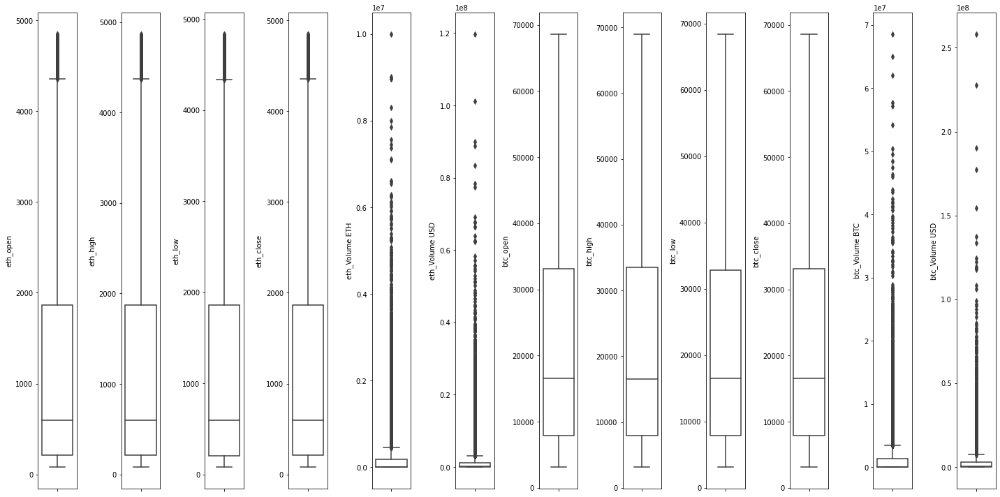

In [13]:
def numeric_eda(df, hue=None):
    """Given dataframe, generate EDA of numeric data"""
    print("\nTo check: \nDistribution of numeric data")
    display(df.describe().T)
    columns = df.select_dtypes(include=np.number).columns
    figure = plt.figure(figsize=(20, 10))
    figure.add_subplot(1, len(columns), 1)
    for index, col in enumerate(columns):
        if index > 0:
            figure.add_subplot(1, len(columns), index + 1)
        sns.boxplot(y=col, data=df, boxprops={'facecolor': 'None'})
    figure.tight_layout()
    plt.show()
# EDA of numeric data
numeric_eda(merged_df)

In [14]:
merged_df.describe().T 

,count,mean,std,min,25%,50%,75%,max
eth_open,44491.0,1.222354e+03,1.195941e+03,81.27,208.850000,596.400000,1.867800e+03,4.850000e+03
eth_high,44491.0,1.229878e+03,1.203238e+03,82.05,210.005000,599.140000,1.874300e+03,4.868790e+03
eth_low,44491.0,1.214183e+03,1.187951e+03,80.90,207.640000,592.350000,1.859600e+03,4.835420e+03
eth_close,44491.0,1.222336e+03,1.195892e+03,81.27,208.850000,596.340000,1.867400e+03,4.849060e+03
eth_Volume ETH,44491.0,1.878649e+05,4.606211e+05,0.00,506.205582,3587.978709,1.785956e+05,1.000410e+07
eth_Volume USD,44491.0,1.373083e+06,3.658297e+06,0.00,1127.580000,140133.334000,1.214769e+06,1.197434e+08
btc_open,44491.0,2.148798e+04,1.666167e+04,3139.76,7930.940000,16540.000000,3.317295e+04,6.863505e+04
btc_high,44491.0,2.159769e+04,1.675600e+04,3158.34,7966.790000,16568.000000,3.346745e+04,6.900000e+04
btc_low,44491.0,2.137026e+04,1.655959e+04,3122.28,7887.555000,16505.000000,3.287276e+04,6.844700e+04
btc_close,44491.0,2.148843e+04,1.666172e+04,3139.76,7930.940000,16539.000000,3.316211e+04,6.862701e+04


#### Data Visualization 

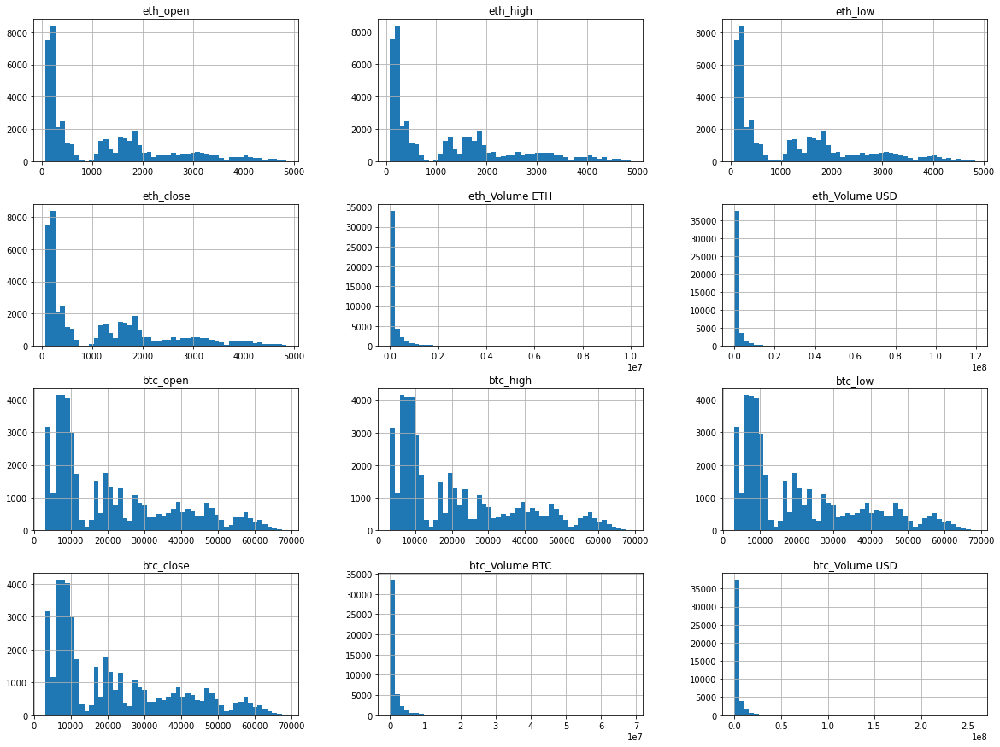

In [15]:
merged_df.hist(bins=50, figsize=(20,15))
plt.show()

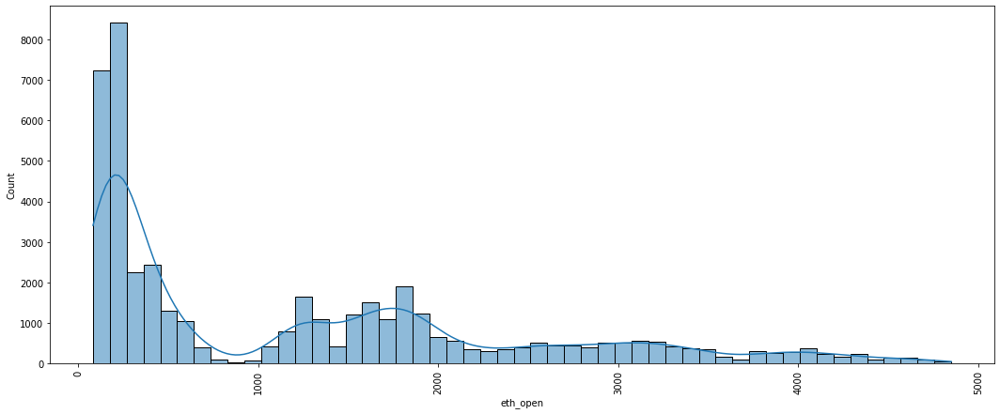

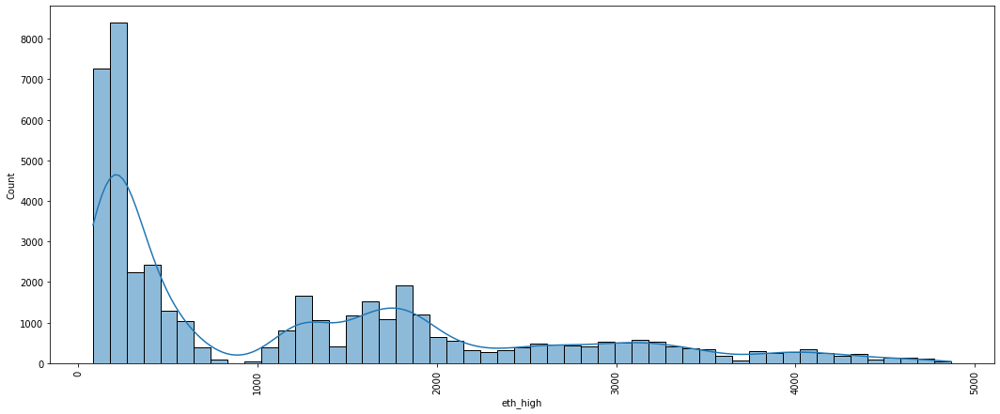

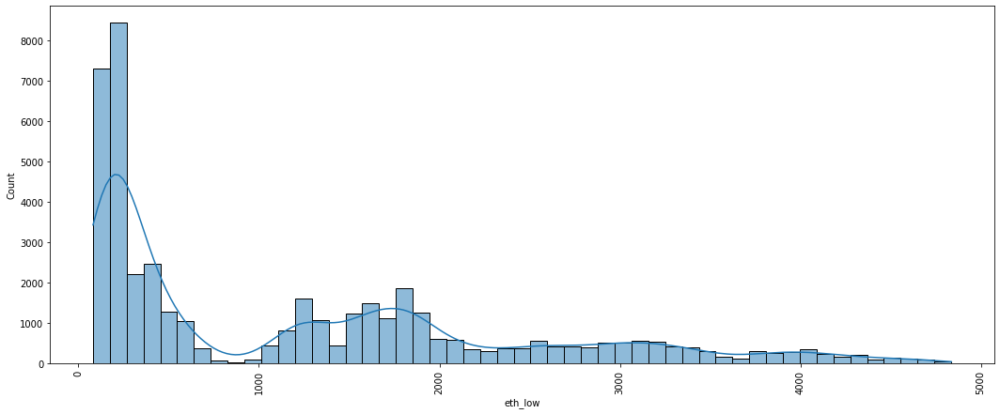

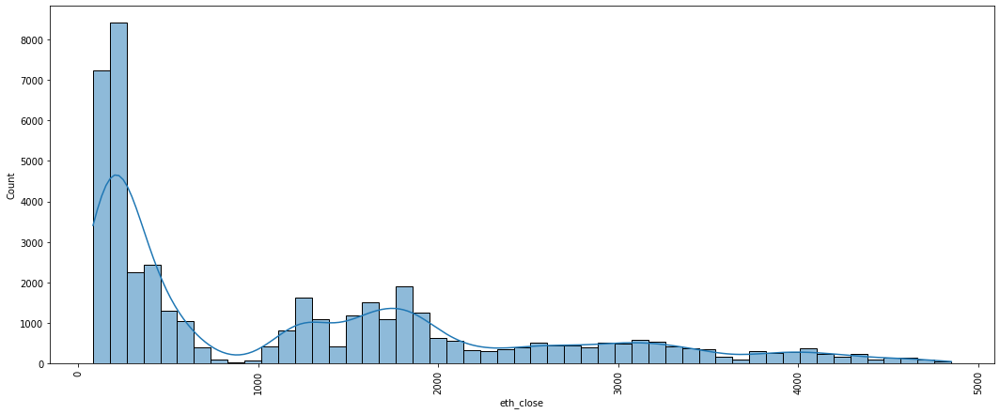

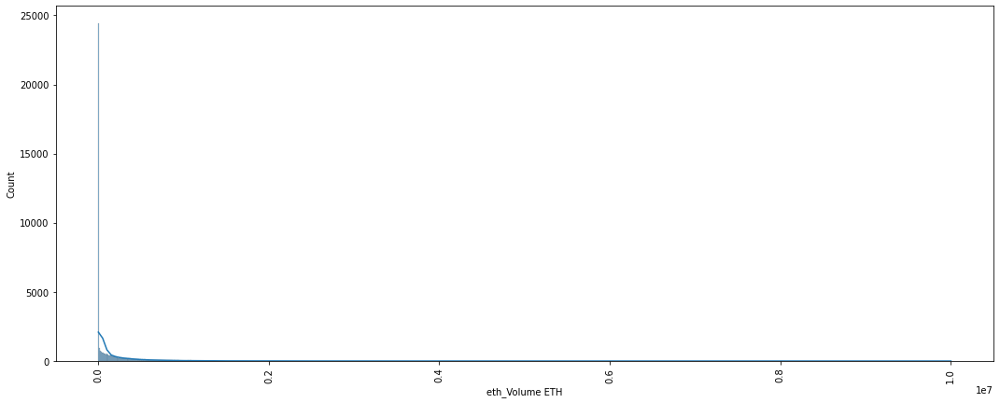

...

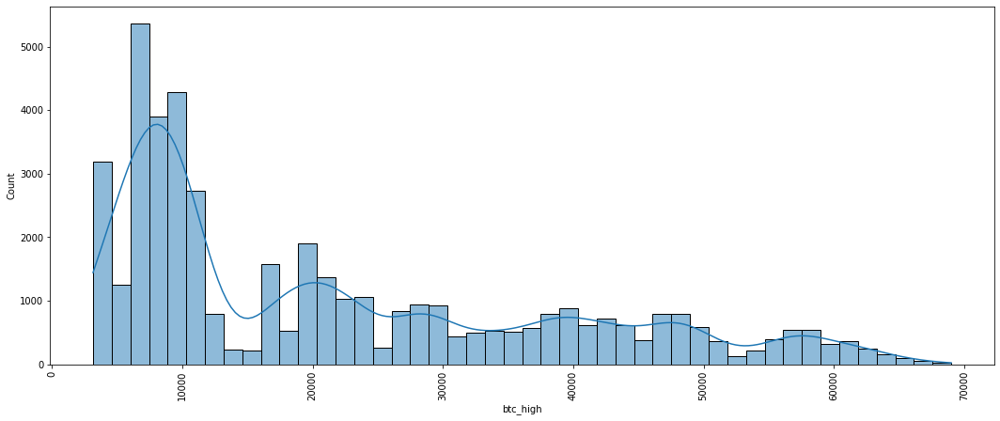

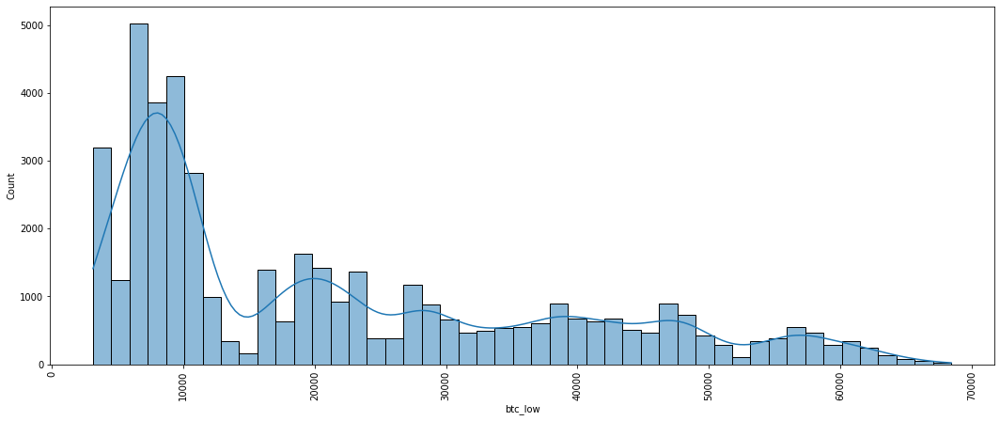

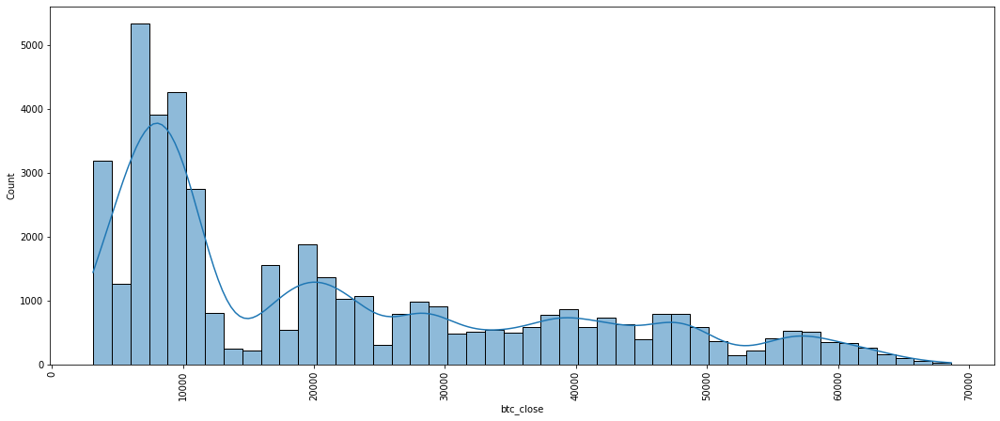

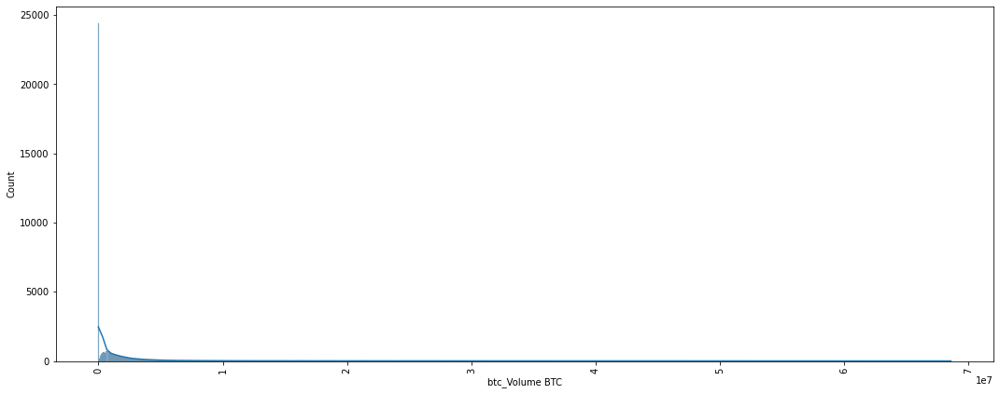

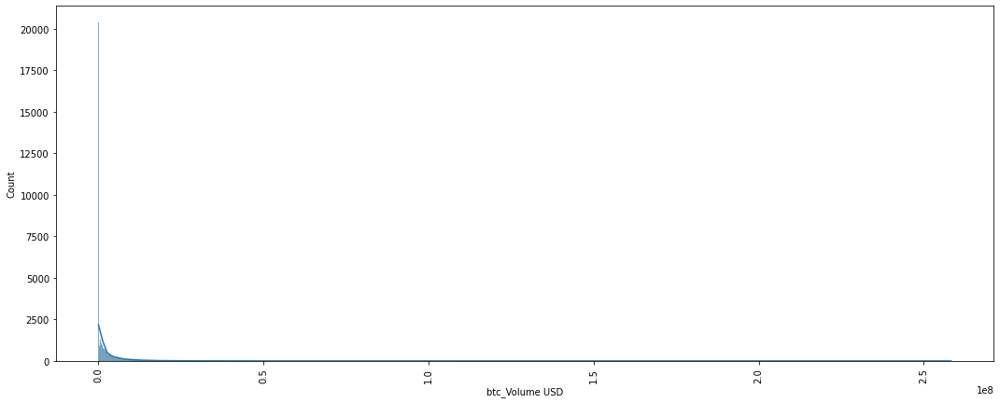

In [16]:
for i in merged_df.columns:
    plt.figure(figsize=(18,7))
    sns.histplot(data=merged_df[i],kde=True, multiple='stack')
    plt.xticks(rotation=90)
    plt.show()

#### Plottingt the btc_volume and eth_volume ETH in log-log scale. 

In [17]:
btc_etc_df_price = merged_df.copy()
btc_etc_df_price = merged_df.drop(['btc_open','btc_high','btc_low','btc_close', 'eth_open','eth_high','eth_low','eth_close'], axis=1)
# btc_df_price = btc_df.loc[:,['date'], ['volumebtc', 'volumeusd']]
#btc_etc_df_price
for i in btc_etc_df_price.columns:
    plt.figure(figsize=(18,7))
    sns.histplot(data=btc_etc_df_price[i],kde=True, multiple='stack')
    plt.xticks(rotation=90)
    plt.yscale('log')
    plt.xscale('log')
    plt.show()

-  notes:
    - The frequncy disctribution shows there are few txs containg high volume of btc that worth more than million dollar. 

#### Time series aggregation analysis:

In [ ]:
df = main_merged_df.copy()
df['date']= pd.to_datetime(df['eth_date'])

In [ ]:
df['minute'] = df['date'].dt.minute
df['hour'] = df['date'].dt.hour
df['day'] = df['date'].dt.dayofweek
df['dayName'] = df['date'].dt.day_name()
df['dayOfYear'] = df['date'].dt.dayofyear
df['monthName'] = df['date'].dt.month_name()
df['month'] = df['date'].dt.month
df['week'] = df['date'].dt.isocalendar().week 
df['year'] = df['date'].dt.year 

In [ ]:
bins = [0,4,8,12,16,20,24]
labels = ['Late Night', 'Early Morning','Morning','Noon','Eve','Night']
df['daySession'] = pd.cut(df['hour'], bins=bins, labels=labels, include_lowest=True)
df.head()

,eth_date,eth_open,eth_high,eth_low,eth_close,eth_Volume ETH,eth_Volume USD,btc_open,btc_high,btc_low,...,minute,hour,day,dayName,dayOfYear,monthName,month,week,year,daySession
0,2023-12-06 00:00:00,1753.4,1753.7,1751.3,1751.5,11.968401,20962.65409,25940.0,25946.0,25920.0,...,0,0,2,Wednesday,340,December,12,49,2023,Late Night
1,2023-11-06 23:00:00,1754.8,1756.7,1748.6,1753.4,74.301041,130279.44450,25904.0,25948.0,25833.0,...,0,23,0,Monday,310,November,11,45,2023,Night
2,2023-11-06 22:00:00,1765.1,1765.4,1742.8,1754.7,185.821385,326060.78450,26060.0,26083.0,25769.0,...,0,22,0,Monday,310,November,11,45,2023,Night
3,2023-11-06 21:00:00,1771.0,1771.9,1764.2,1764.4,67.607610,119286.86630,26139.0,26152.0,25993.0,...,0,21,0,Monday,310,November,11,45,2023,Night
4,2023-11-06 20:00:00,1763.6,1777.7,1763.6,1770.8,107.800478,190893.08630,26048.0,26209.0,26048.0,...,0,20,0,Monday,310,November,11,45,2023,Eve


In [ ]:
df.head()

,eth_date,eth_open,eth_high,eth_low,eth_close,eth_Volume ETH,eth_Volume USD,btc_open,btc_high,btc_low,...,minute,hour,day,dayName,dayOfYear,monthName,month,week,year,daySession
0,2023-12-06 00:00:00,1753.4,1753.7,1751.3,1751.5,11.968401,20962.65409,25940.0,25946.0,25920.0,...,0,0,2,Wednesday,340,December,12,49,2023,Late Night
1,2023-11-06 23:00:00,1754.8,1756.7,1748.6,1753.4,74.301041,130279.44450,25904.0,25948.0,25833.0,...,0,23,0,Monday,310,November,11,45,2023,Night
2,2023-11-06 22:00:00,1765.1,1765.4,1742.8,1754.7,185.821385,326060.78450,26060.0,26083.0,25769.0,...,0,22,0,Monday,310,November,11,45,2023,Night
3,2023-11-06 21:00:00,1771.0,1771.9,1764.2,1764.4,67.607610,119286.86630,26139.0,26152.0,25993.0,...,0,21,0,Monday,310,November,11,45,2023,Night
4,2023-11-06 20:00:00,1763.6,1777.7,1763.6,1770.8,107.800478,190893.08630,26048.0,26209.0,26048.0,...,0,20,0,Monday,310,November,11,45,2023,Eve


In [ ]:
df.tail()

,eth_date,eth_open,eth_high,eth_low,eth_close,eth_Volume ETH,eth_Volume USD,btc_open,btc_high,btc_low,...,minute,hour,day,dayName,dayOfYear,monthName,month,week,year,daySession
44486,2018-05-15 10:00:00,727.32,739.37,725.04,733.59,1424387.90,1943.15,8708.32,8865.00,8695.11,...,0,10,1,Tuesday,135,May,5,20,2018,Morning
44487,2018-05-15 09:00:00,731.68,731.82,726.98,727.32,438411.32,601.03,8728.49,8754.40,8701.35,...,0,9,1,Tuesday,135,May,5,20,2018,Morning
44488,2018-05-15 08:00:00,733.82,734.92,721.58,731.68,2860231.46,3924.55,8739.00,8750.27,8660.53,...,0,8,1,Tuesday,135,May,5,20,2018,Early Morning
44489,2018-05-15 07:00:00,733.00,735.99,730.45,733.82,259456.87,353.82,8740.99,8766.00,8721.11,...,0,7,1,Tuesday,135,May,5,20,2018,Early Morning
44490,2018-05-15 06:00:00,732.10,736.67,730.94,733.00,766208.66,1043.91,8733.86,8796.68,8707.28,...,0,6,1,Tuesday,135,May,5,20,2018,Early Morning


In [ ]:
df['dayName'].value_counts()

Friday       6384
Monday       6360
Thursday     6360
Saturday     6360
Tuesday      6354
Wednesday    6337
Sunday       6336
Name: dayName, dtype: int64

In [ ]:
df['daySession'].value_counts()

Late Night       9266
Morning          7416
Noon             7416
Eve              7416
Early Morning    7415
Night            5562
Name: daySession, dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44491 entries, 0 to 44490
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   eth_date        44491 non-null  datetime64[ns]
 1   eth_open        44491 non-null  float64       
 2   eth_high        44491 non-null  float64       
 3   eth_low         44491 non-null  float64       
 4   eth_close       44491 non-null  float64       
 5   eth_Volume ETH  44491 non-null  float64       
 6   eth_Volume USD  44491 non-null  float64       
 7   btc_open        44491 non-null  float64       
 8   btc_high        44491 non-null  float64       
 9   btc_low         44491 non-null  float64       
 10  btc_close       44491 non-null  float64       
 11  btc_Volume BTC  44491 non-null  float64       
 12  btc_Volume USD  44491 non-null  float64       
 13  date            44491 non-null  datetime64[ns]
 14  minute          44491 non-null  int64         
 15  ho

In [ ]:
df['dayName'] = df['dayName'].astype('category')
df['monthName'] = df['monthName'].astype('category')

In [ ]:
def top5(df):
    """Given dataframe, generate top 5 unique values for categorical data"""
    columns = df.select_dtypes(include=['category']).columns
    for col in columns:
        print("Top 5 unique values of " + col)
        print(df[col].value_counts().reset_index().rename(columns={"index": col, col: "Count"})[
              :min(5, len(df[col].value_counts()))])
        print(" ")

def categorical_eda(df, hue=None):
    """Given dataframe, generate EDA of categorical data"""
    print("\nTo check: \nUnique count of non-numeric data\n")
    print(df.select_dtypes(include=['object', 'category']).nunique())
    top5(df)
    # Plot count distribution of categorical data
    for col in df.select_dtypes(include='category').columns:
        fig = sns.catplot(x=col, kind="count", data=df, hue=hue,height=8.27, aspect=11.7/8.27)
        fig.set_xticklabels(rotation=90)
        
        plt.show()


To check: 
Unique count of non-numeric data

dayName        7
monthName     12
daySession     6
dtype: int64
Top 5 unique values of dayName
    dayName  Count
0    Friday   6384
1    Monday   6360
2  Saturday   6360
3  Thursday   6360
4   Tuesday   6354
 
Top 5 unique values of monthName
  monthName  Count
0       May   4146
1    August   3744
2   January   3744
3      July   3744
4     March   3744
 
Top 5 unique values of daySession
      daySession  Count
0     Late Night   9266
1        Morning   7416
2           Noon   7416
3            Eve   7416
4  Early Morning   7415
 


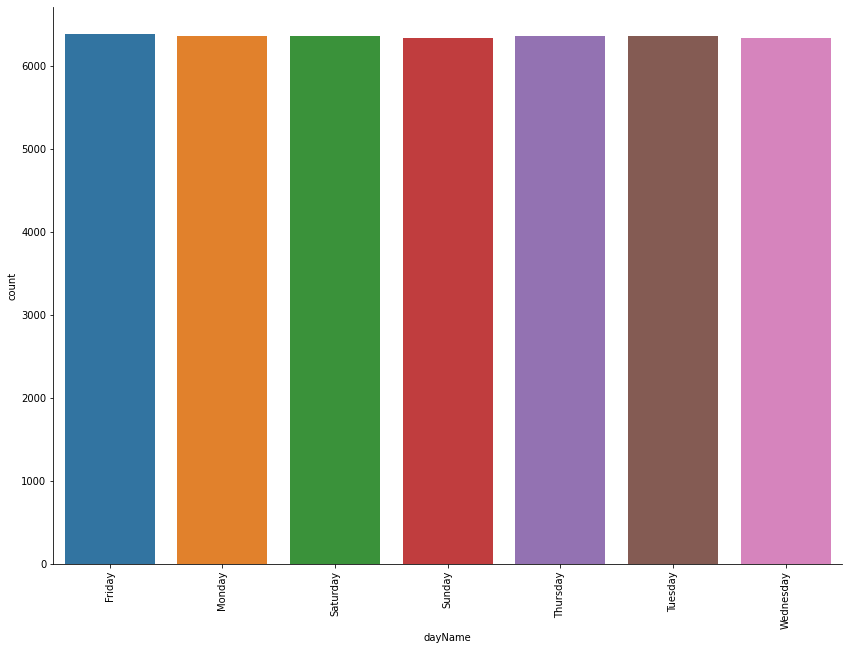

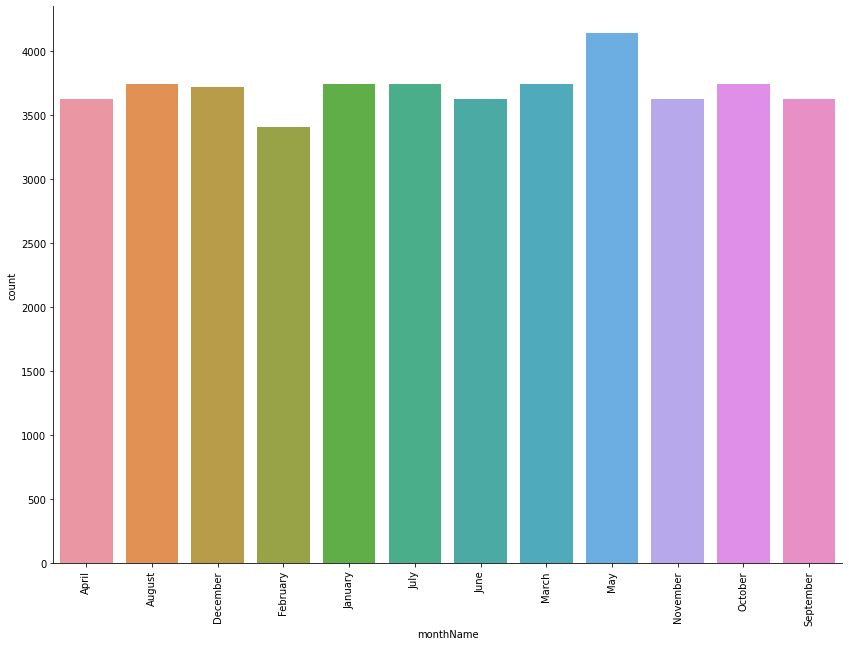

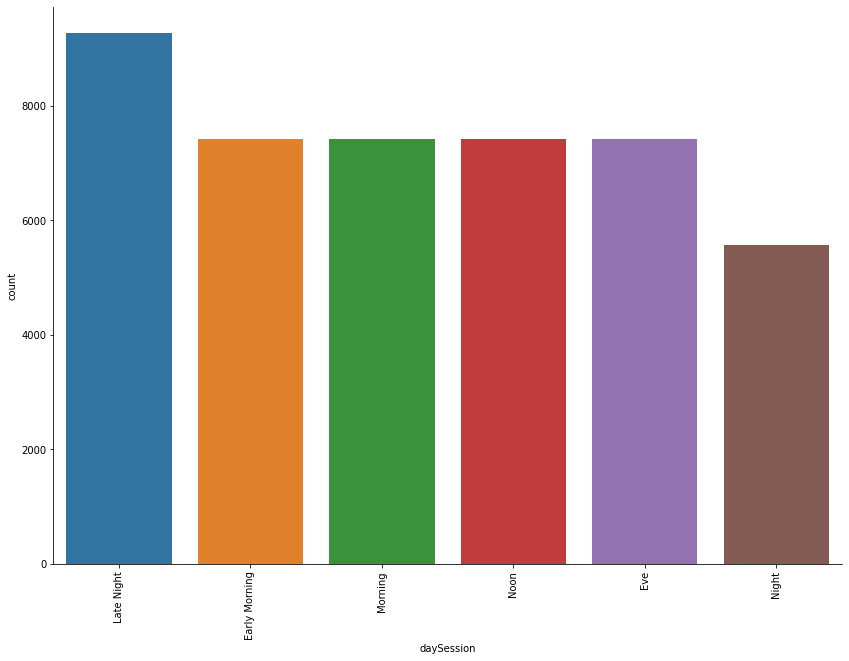

In [ ]:
categorical_eda(df)

In [ ]:
main_merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44491 entries, 0 to 44490
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   eth_date        44491 non-null  datetime64[ns]
 1   eth_open        44491 non-null  float64       
 2   eth_high        44491 non-null  float64       
 3   eth_low         44491 non-null  float64       
 4   eth_close       44491 non-null  float64       
 5   eth_Volume ETH  44491 non-null  float64       
 6   eth_Volume USD  44491 non-null  float64       
 7   btc_open        44491 non-null  float64       
 8   btc_high        44491 non-null  float64       
 9   btc_low         44491 non-null  float64       
 10  btc_close       44491 non-null  float64       
 11  btc_Volume BTC  44491 non-null  float64       
 12  btc_Volume USD  44491 non-null  float64       
dtypes: datetime64[ns](1), float64(12)
memory usage: 4.8 MB


In [ ]:
ts_plot_df =main_merged_df.copy()
ts_plot_df = main_merged_df.astype({"eth_date": "datetime64"})


To check time series of numeric data  by daily, monthly and yearly frequency
Plotting daily data


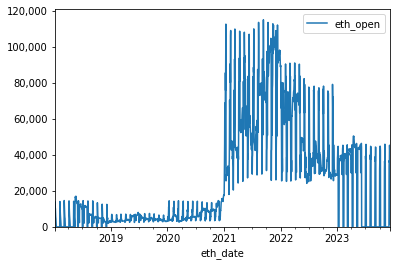

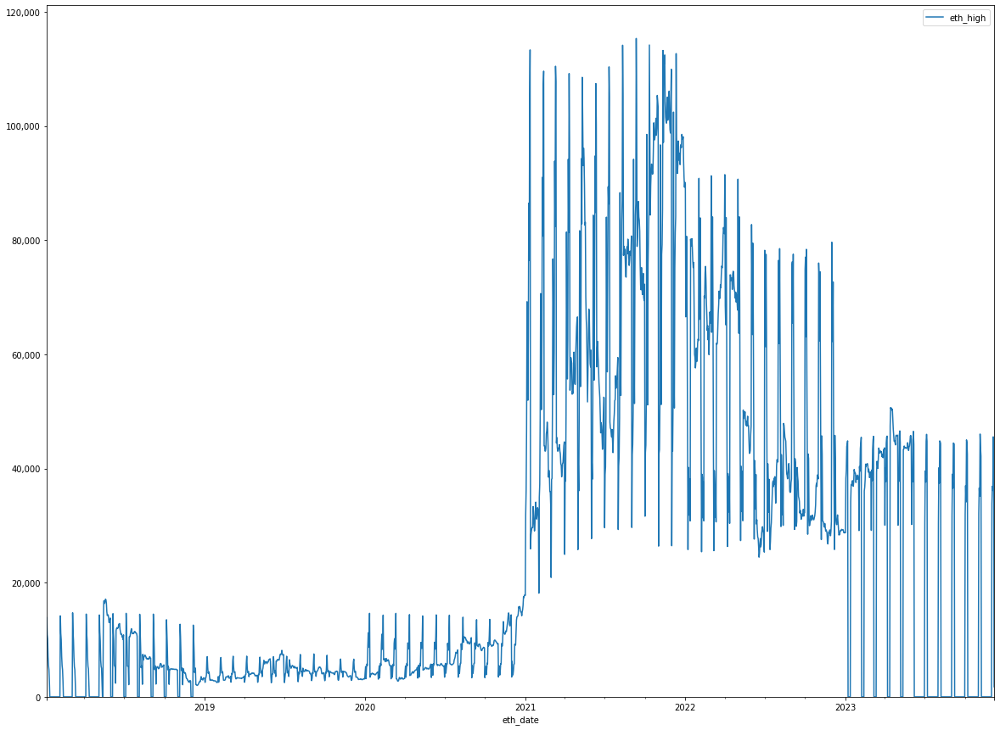

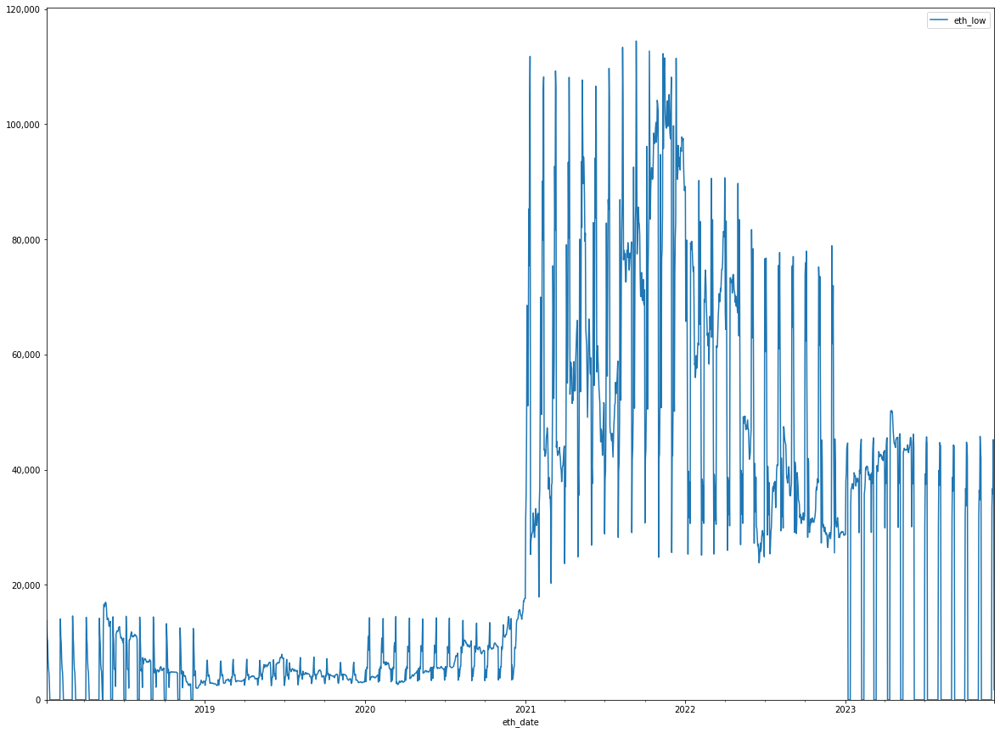

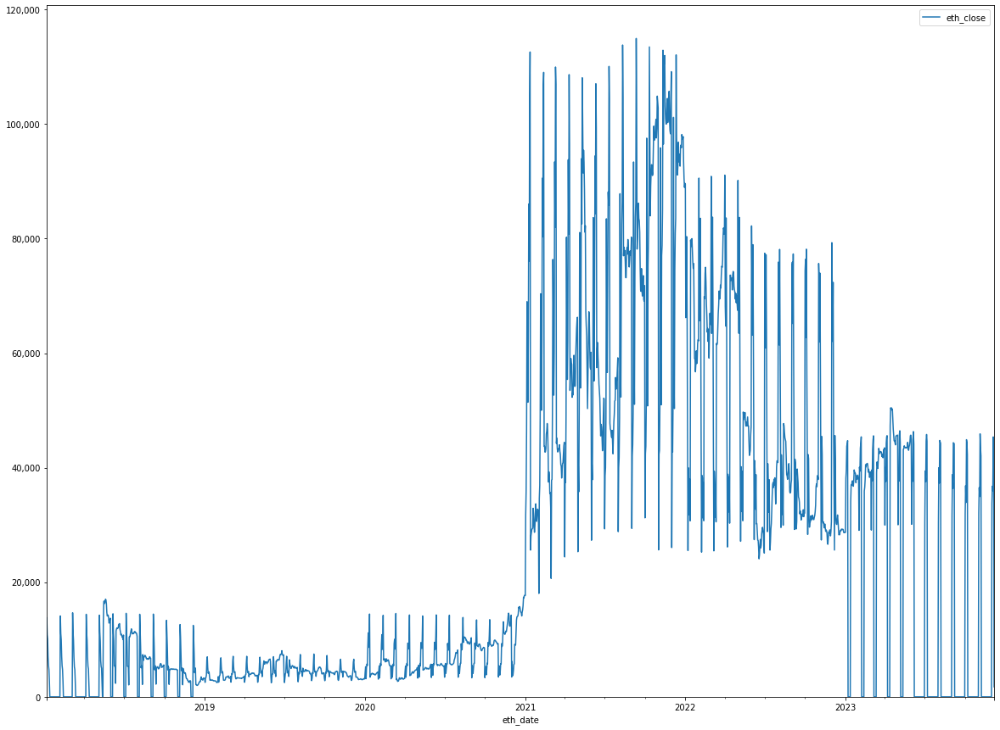

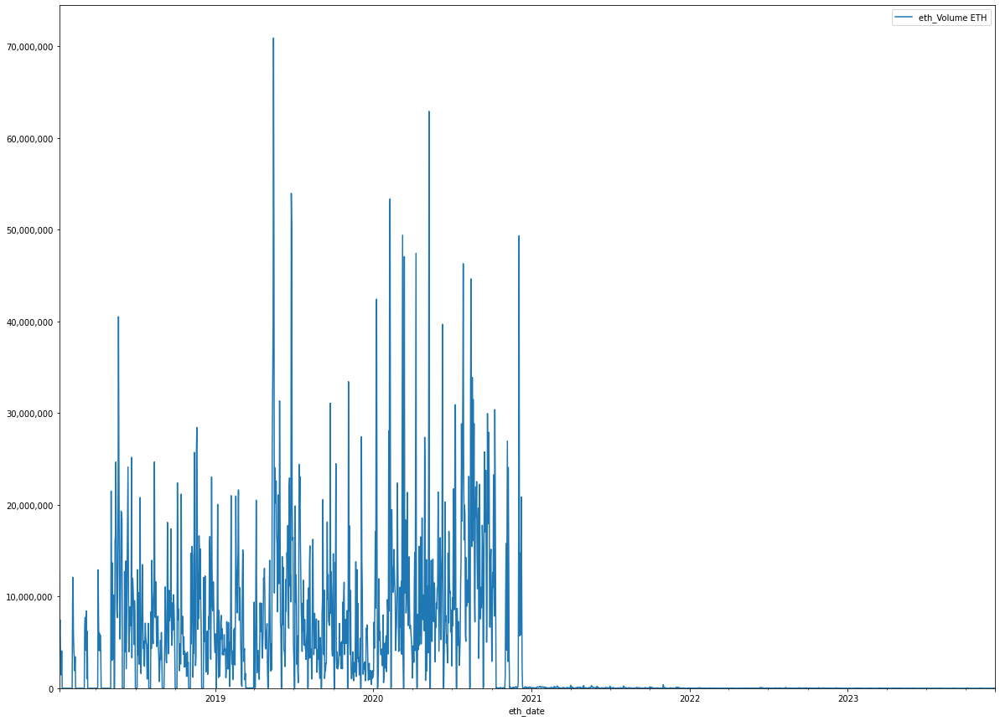

...

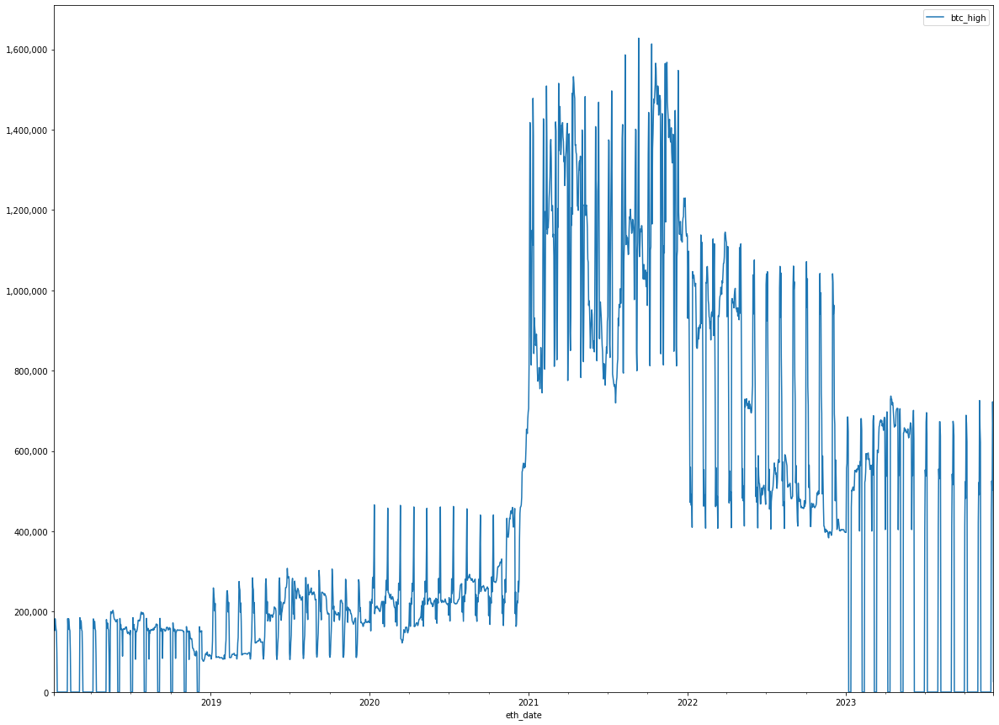

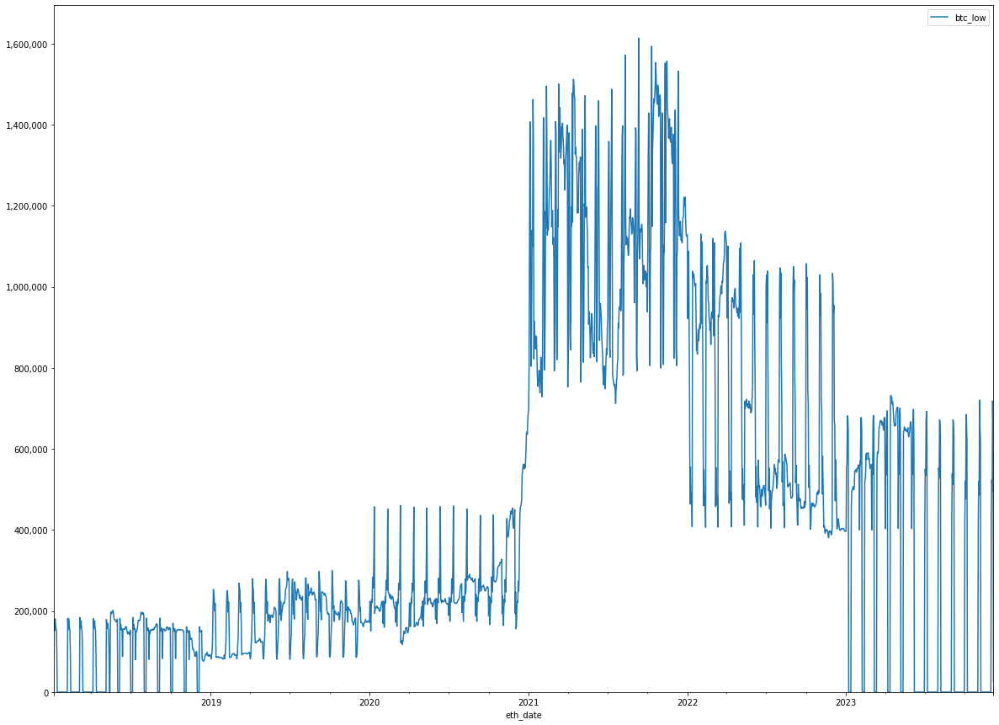

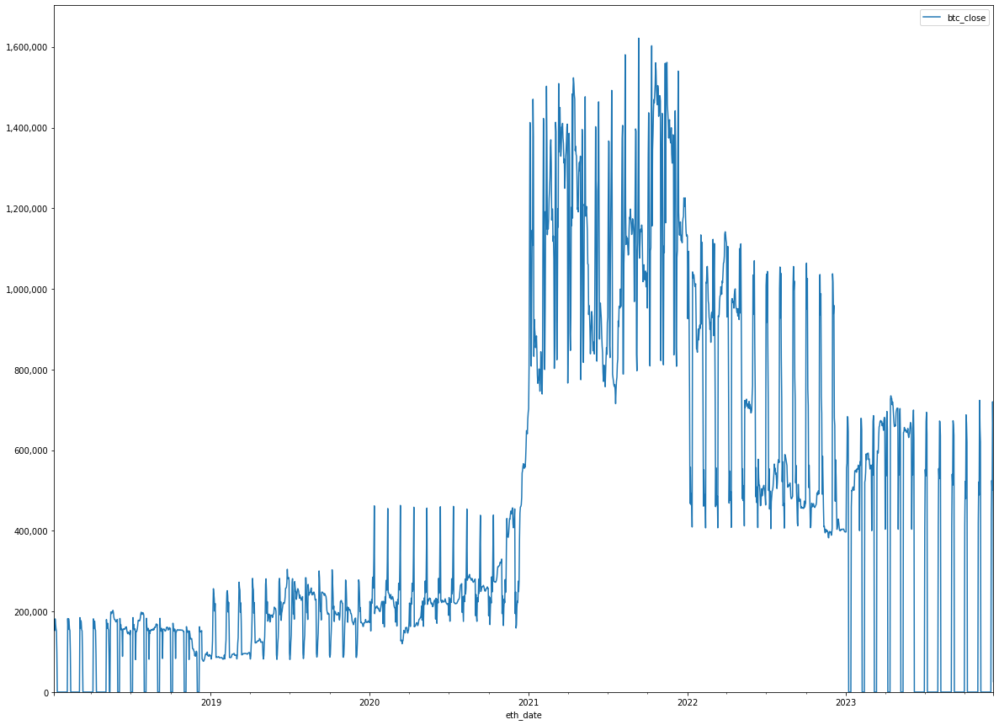

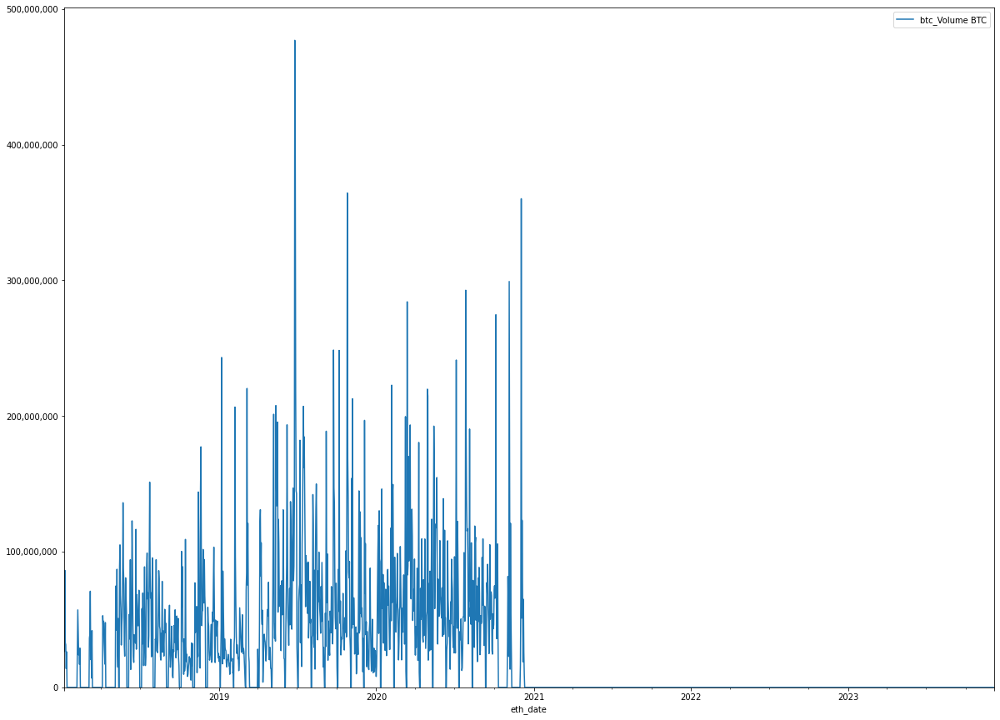

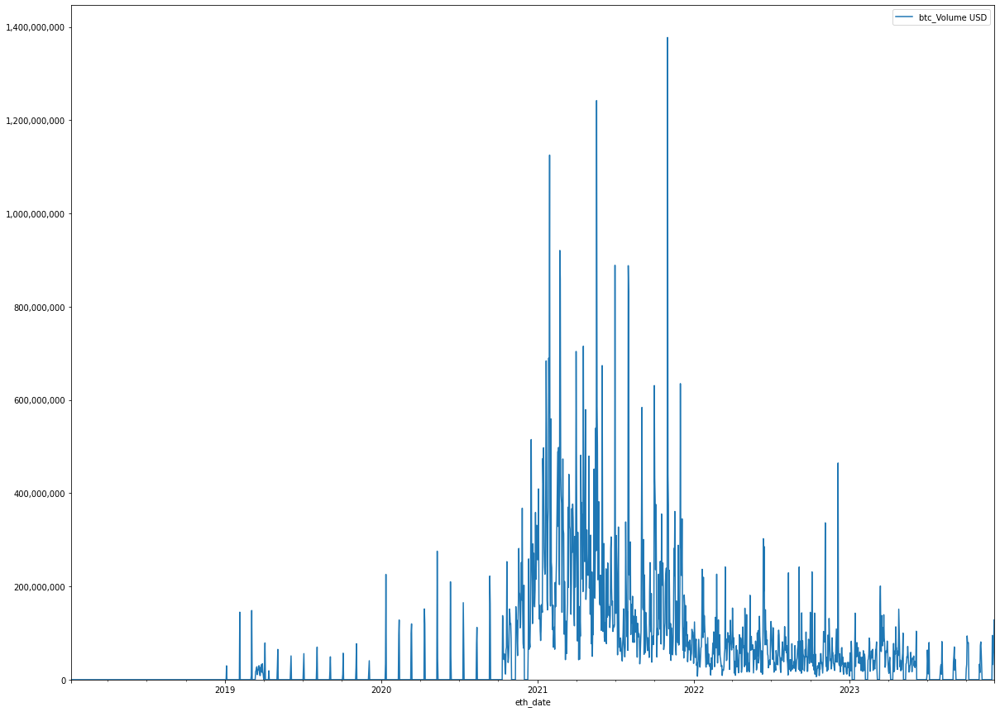

In [ ]:
import matplotlib
def time_series_plot(df):
    """Given dataframe, generate times series plot of numeric data by daily, monthly and yearly frequency"""
    print("\nTo check time series of numeric data  by daily, monthly and yearly frequency")
    if len(df.select_dtypes(include='datetime64').columns)>0:
        for col in df.select_dtypes(include='datetime64').columns:
            for p in ['D']:
                if p=='D':
                    print("Plotting daily data")
                # elif p=='M':
                #     print("Plotting monthly data")
                # else:
                #     print("Plotting yearly data")
                for col_num in df.select_dtypes(include=np.number).columns:
                    __ = df.copy()
                    __ = __.set_index(col)
                    __T = __.resample(p).sum()
                    ax = __T[[col_num]].plot()
                    ax.set_ylim(bottom=0)
                    plt.rcParams["figure.figsize"] = (20,15)
                    ax.get_yaxis().set_major_formatter(
                    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
                    
                    plt.show()
time_series_plot(ts_plot_df)

-  btc_volume BTC has some very drastic decreament of volume from 2021 -2023. Need to investigate that issue. 

In [ ]:
df.columns

Index(['eth_date', 'eth_open', 'eth_high', 'eth_low', 'eth_close',
       'eth_Volume ETH', 'eth_Volume USD', 'btc_open', 'btc_high', 'btc_low',
       'btc_close', 'btc_Volume BTC', 'btc_Volume USD', 'date', 'minute',
       'hour', 'day', 'dayName', 'dayOfYear', 'monthName', 'month', 'week',
       'year', 'daySession', 'day_of_week', 'datetime', 'datetime_asia',
       'datetime_usa', 'datetime_europe', 'Location'],
      dtype='object')

In [ ]:
selected_years = [2021,2022,2023]
# Filter the DataFrame for the selected years
selected_years_df = df[df['year'].isin(selected_years)]

# Check if the column has non-zero data for the selected years
has_nonzero_data = (selected_years_df['btc_Volume BTC'] != 0).any()

if has_nonzero_data:
    print("The column has non-zero data for the selected years.")
else:
    print("The column does not have non-zero data for the selected years.")


The column has non-zero data for the selected years.



To check time series of numeric data  by daily, monthly and yearly frequency
Plotting daily data


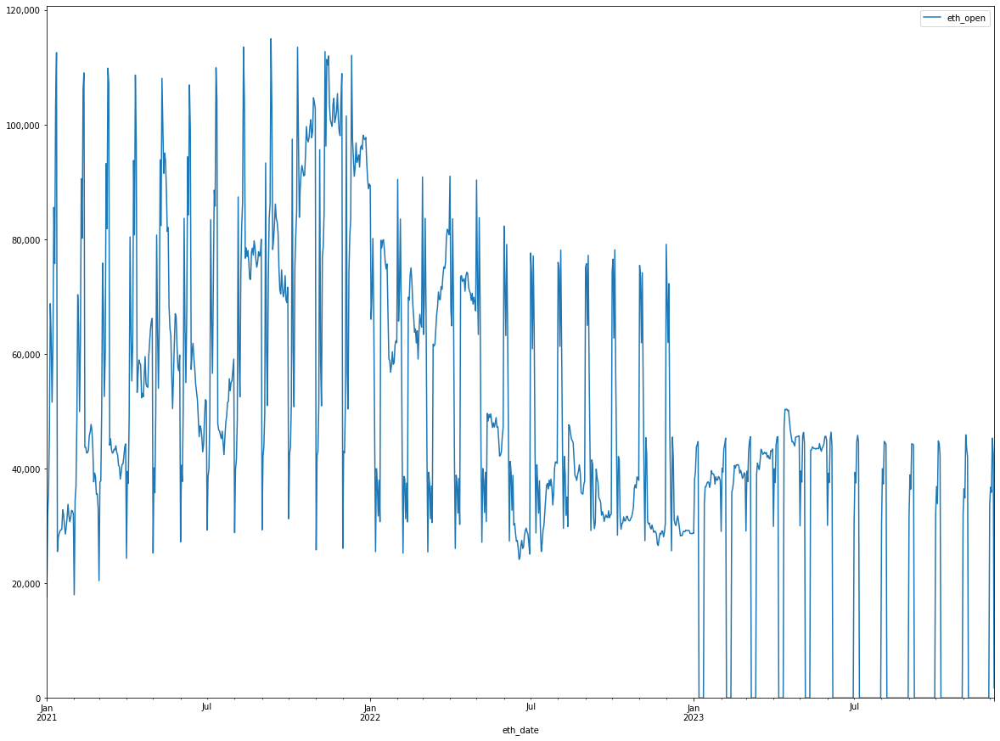

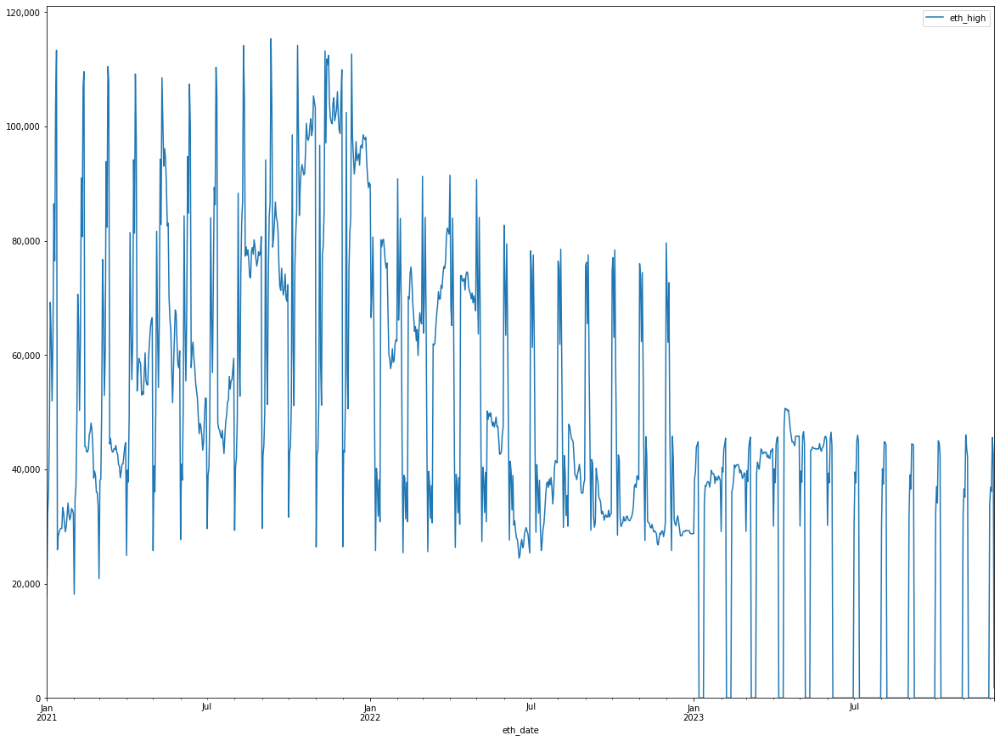

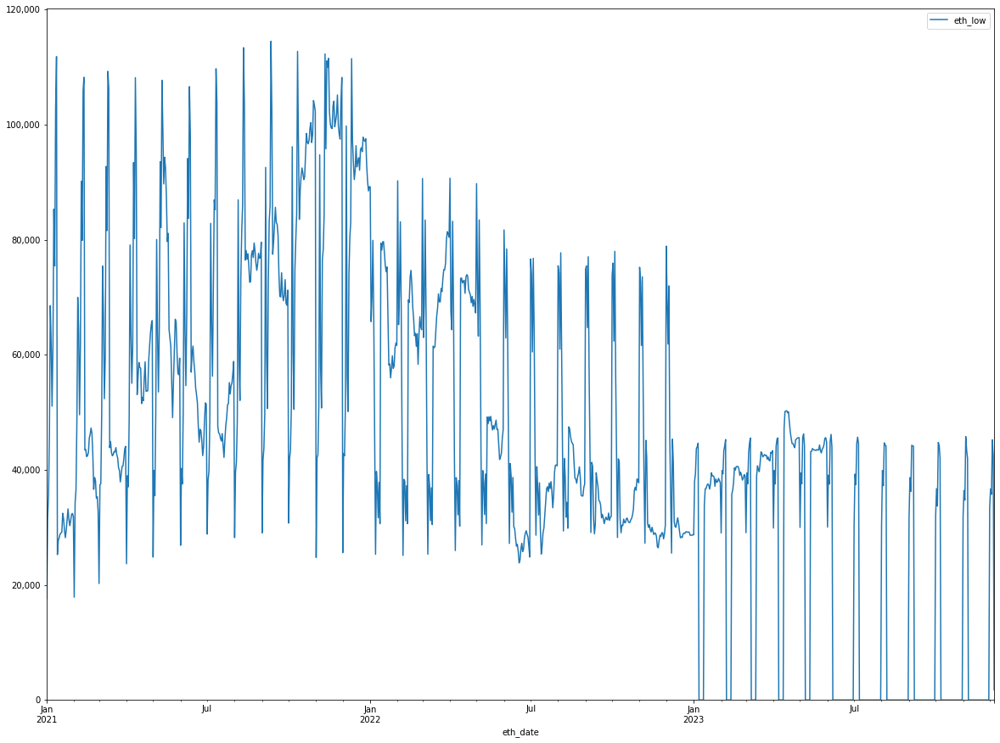

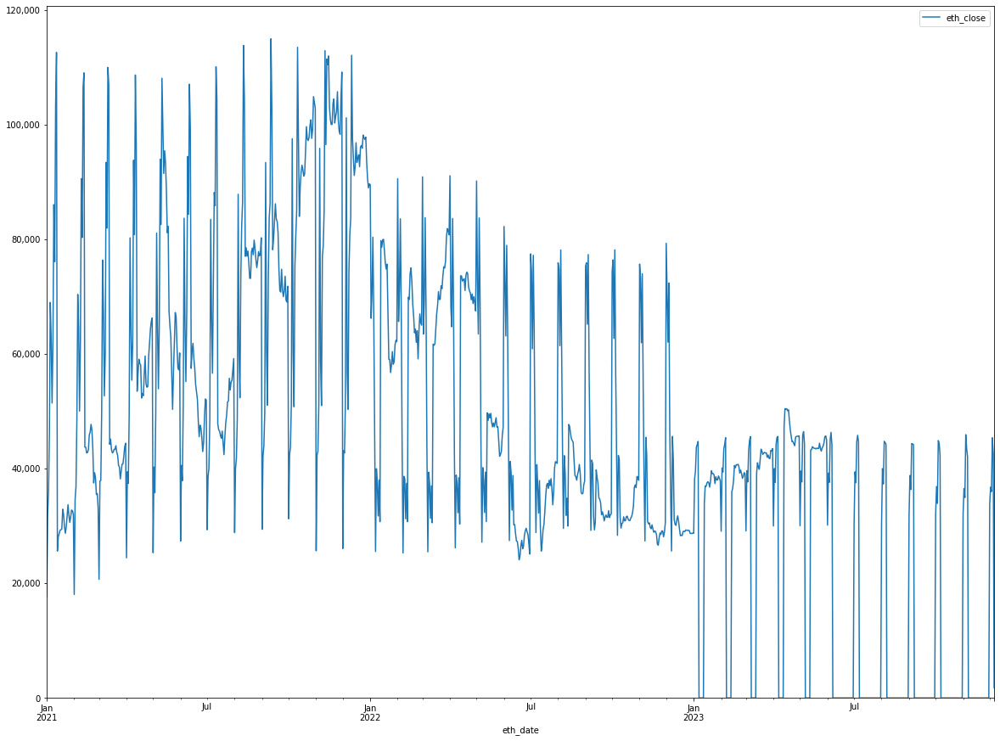

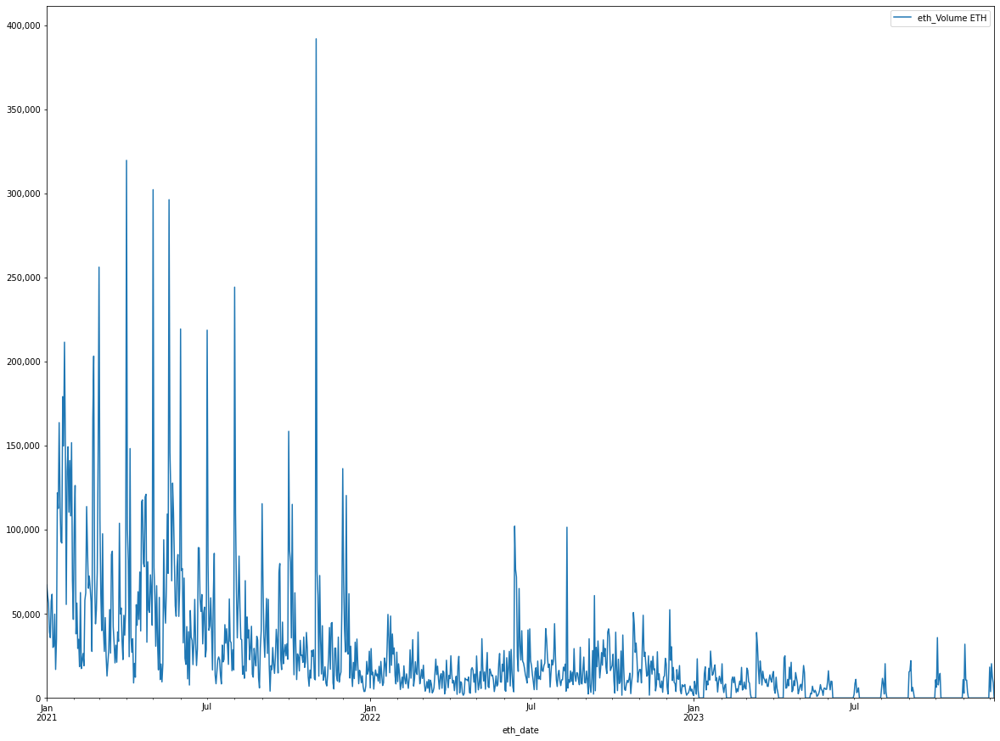

...

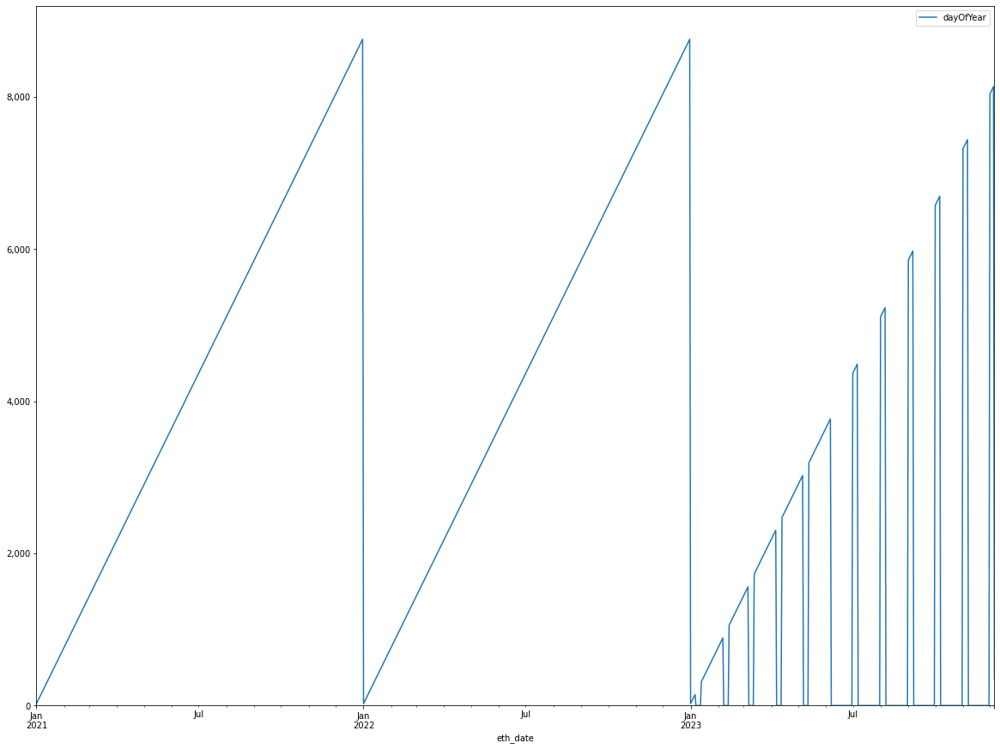

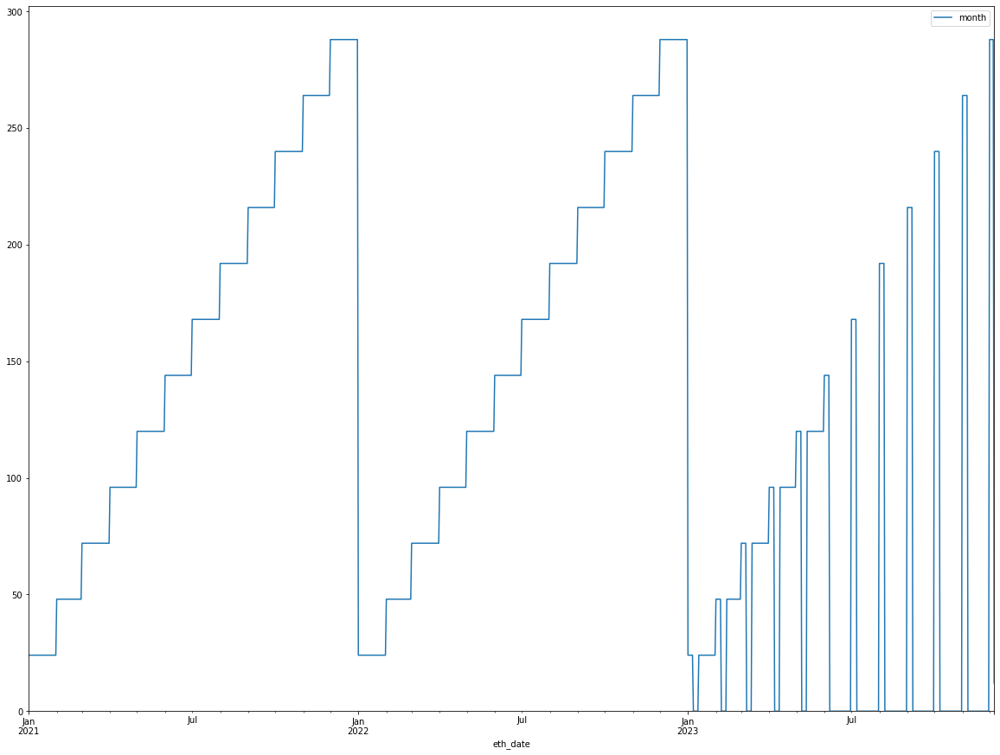

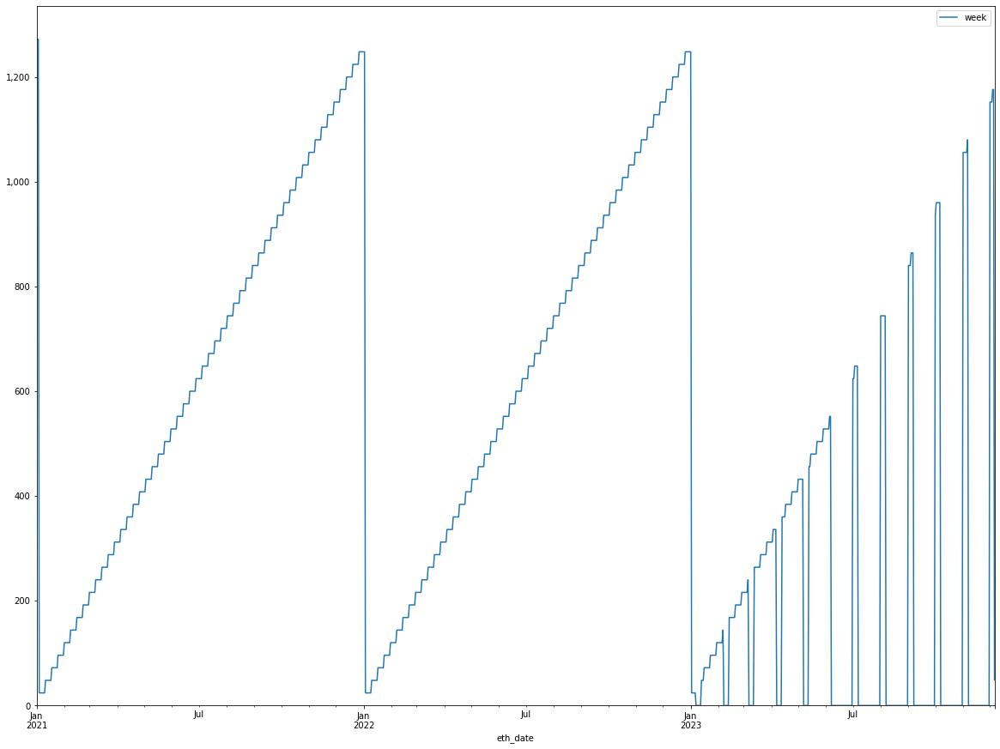

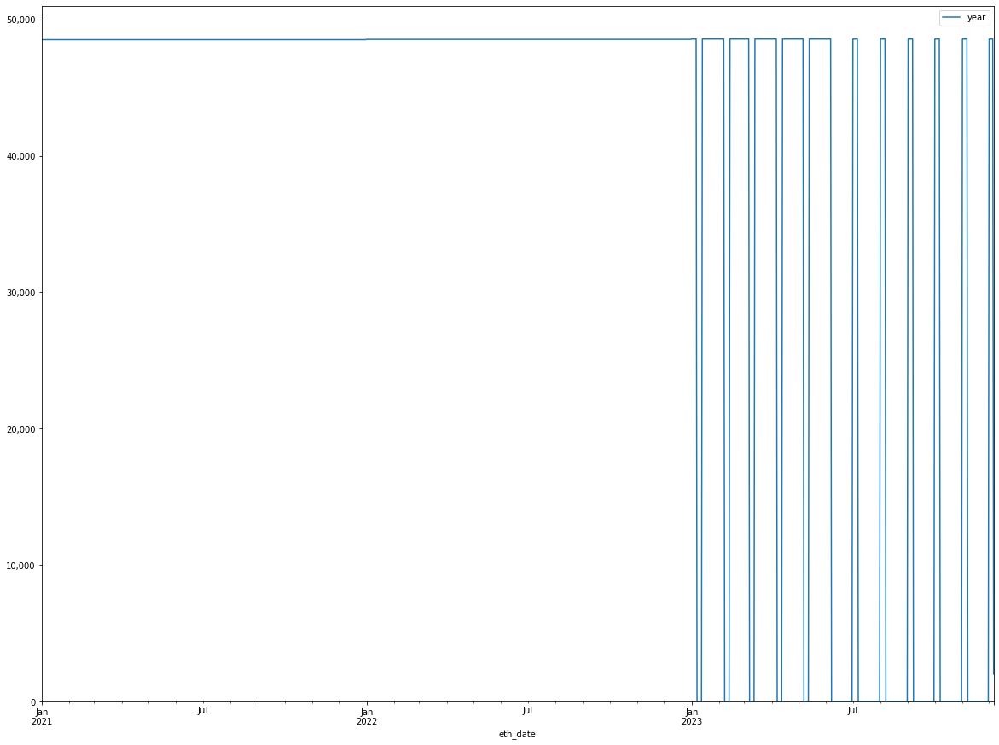

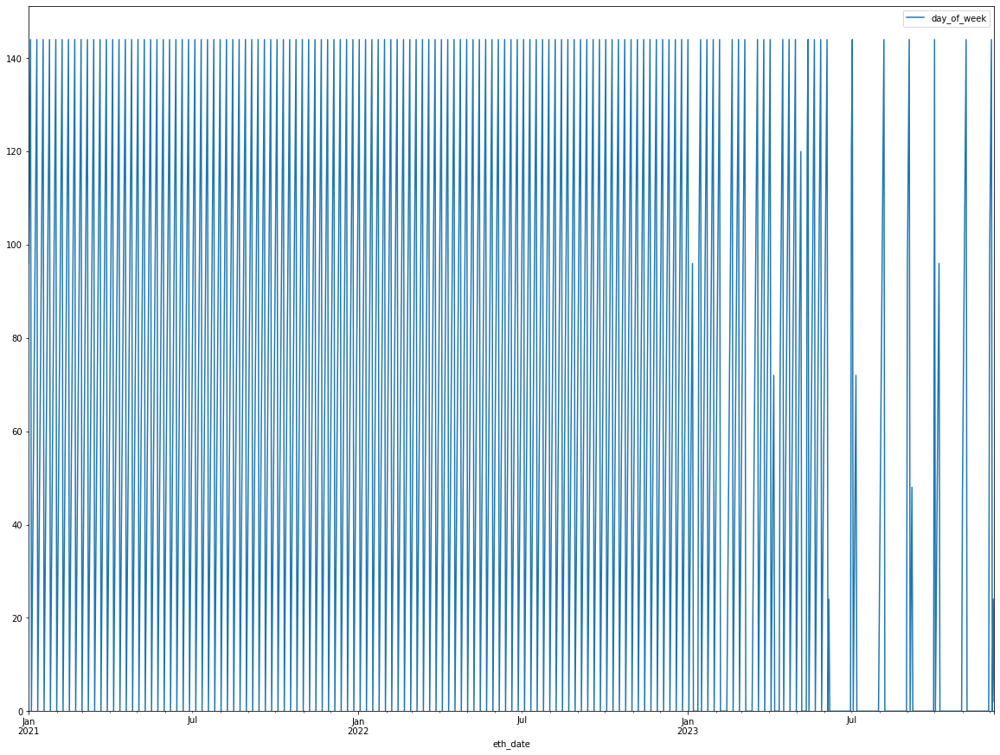

Plotting daily data


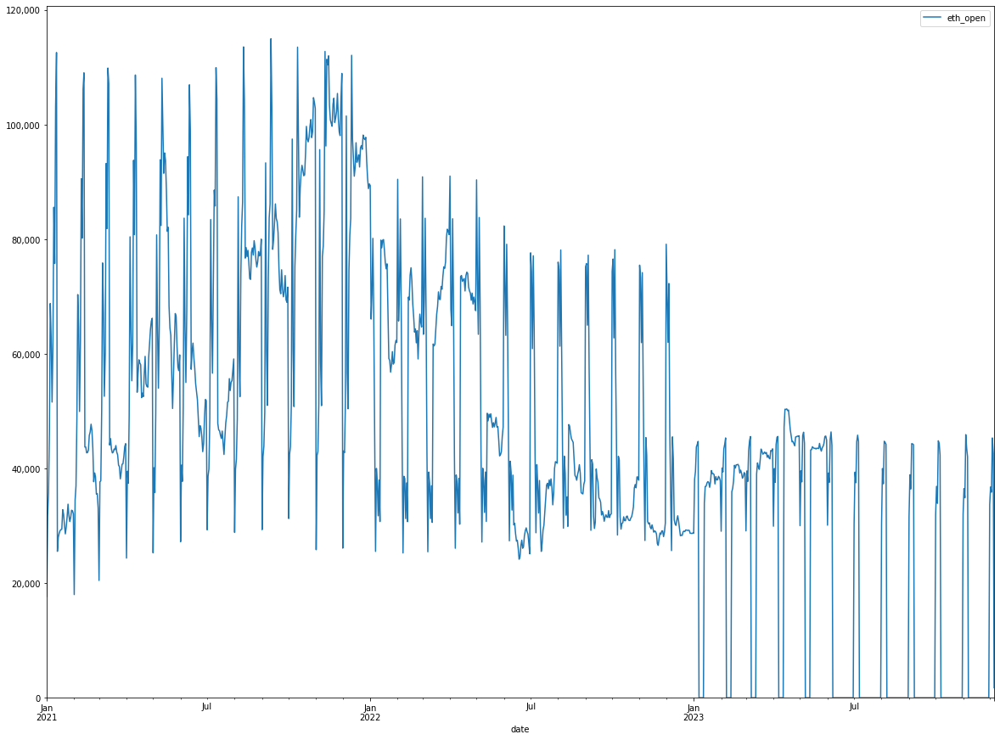

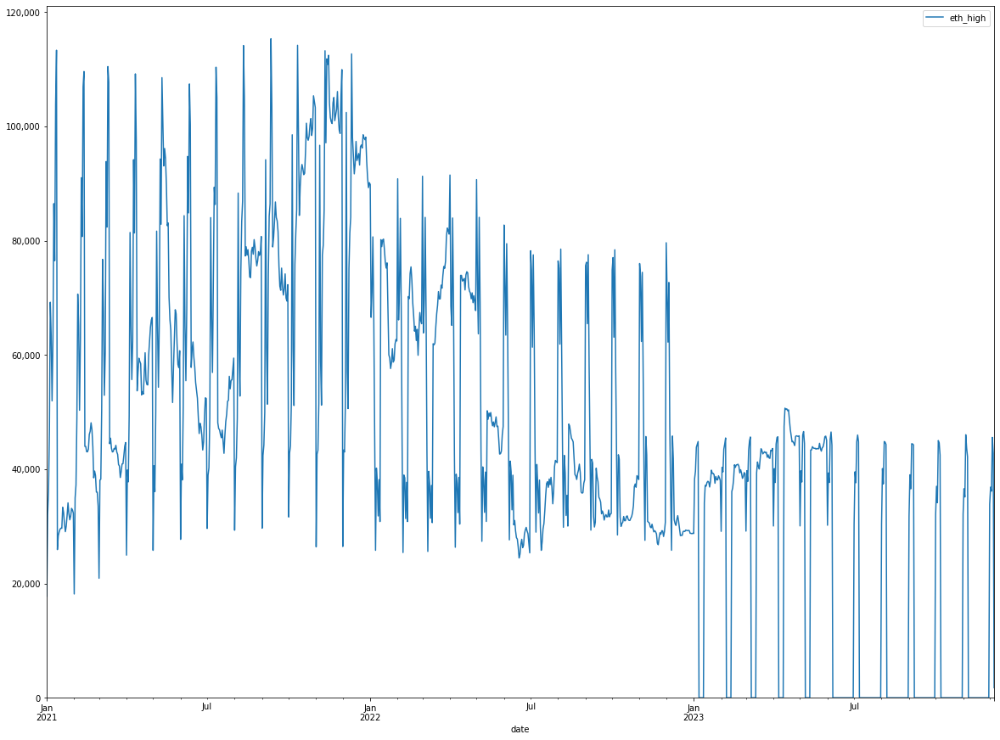

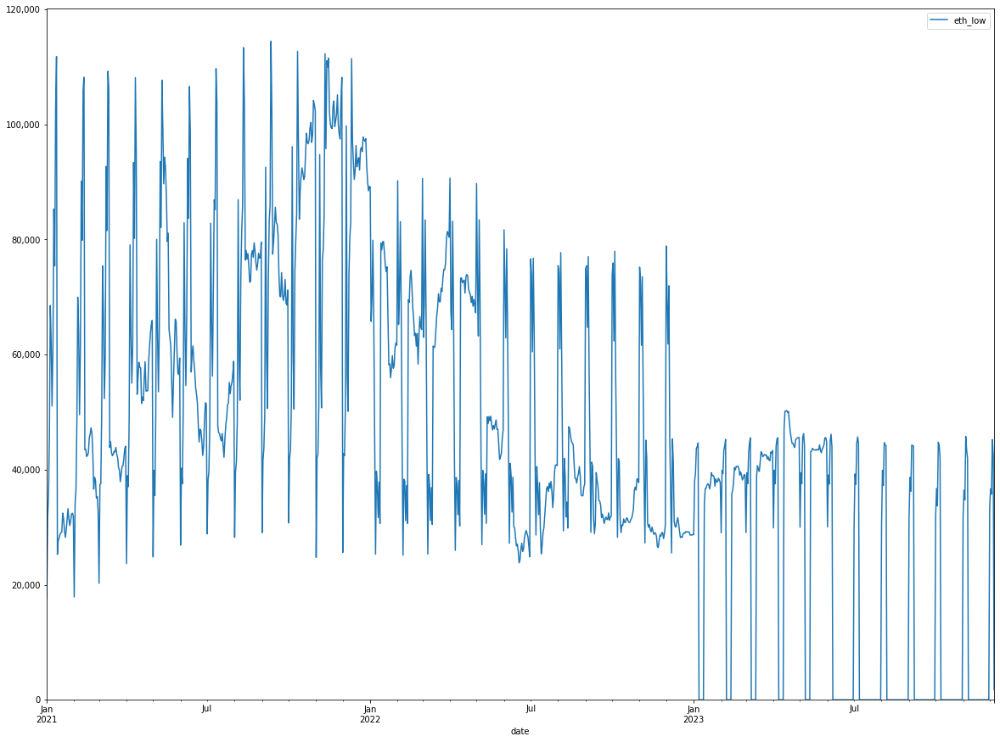

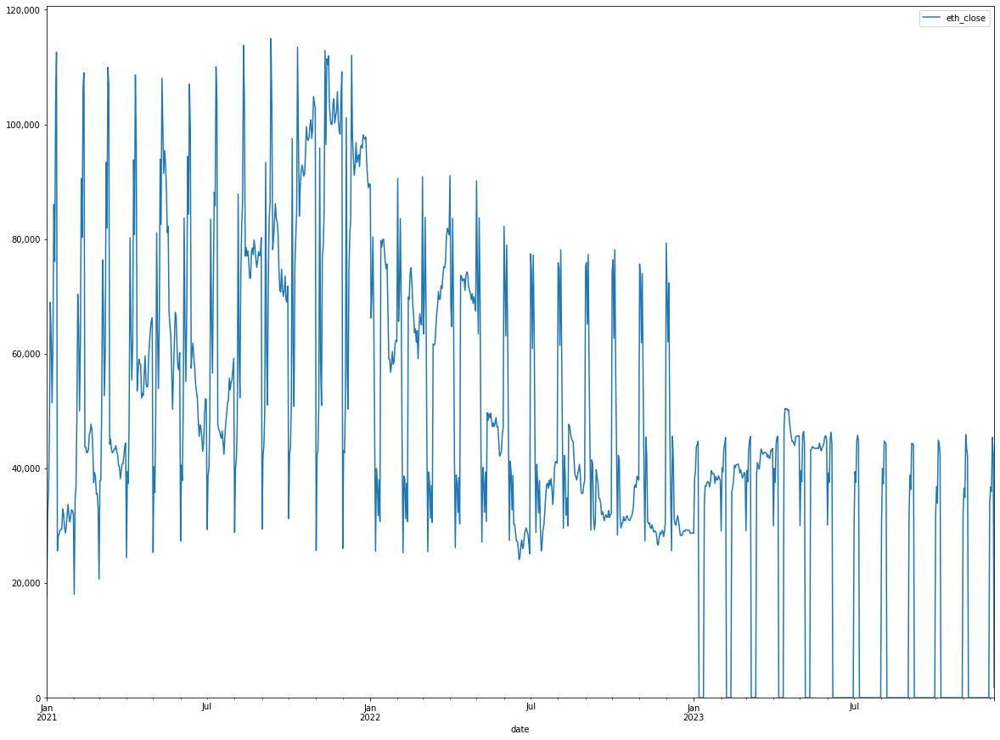

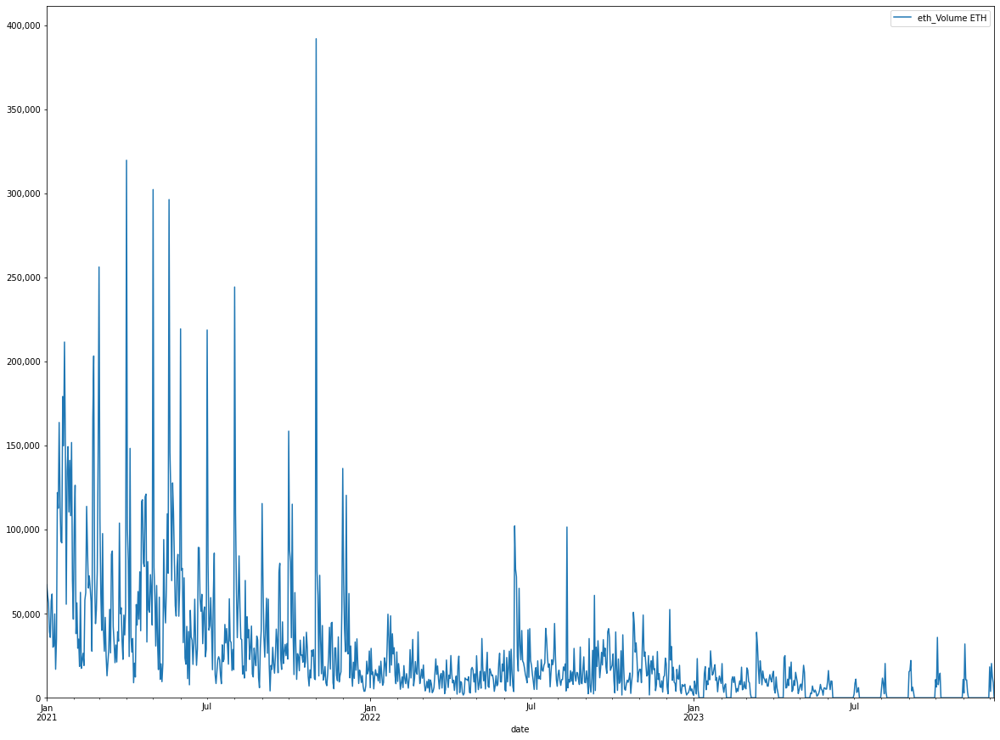

...

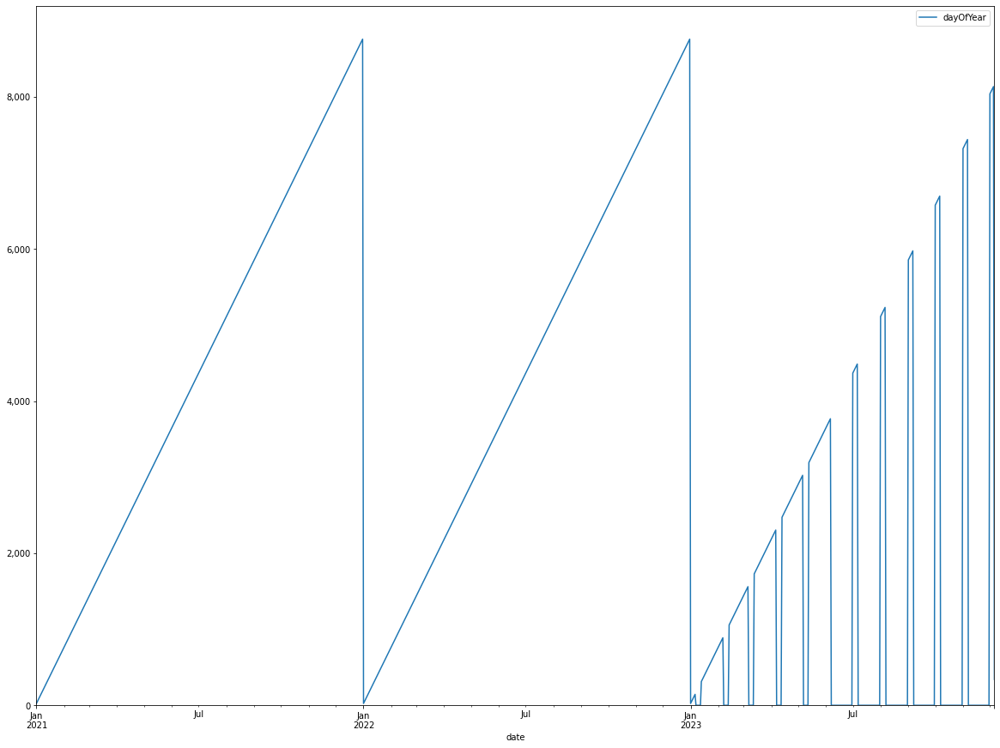

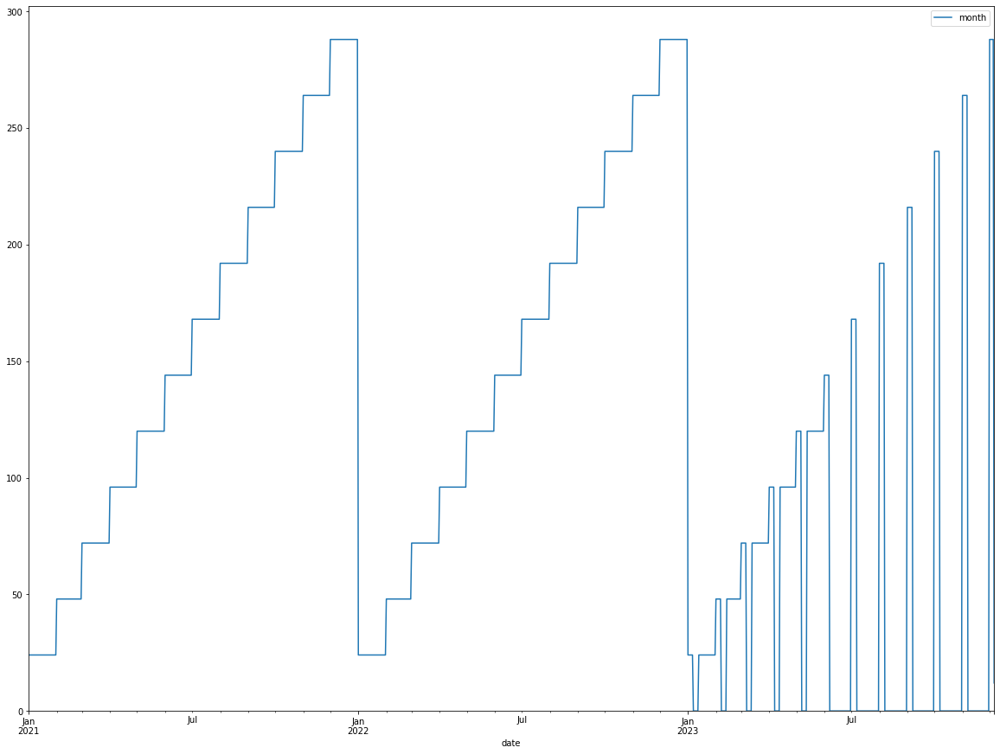

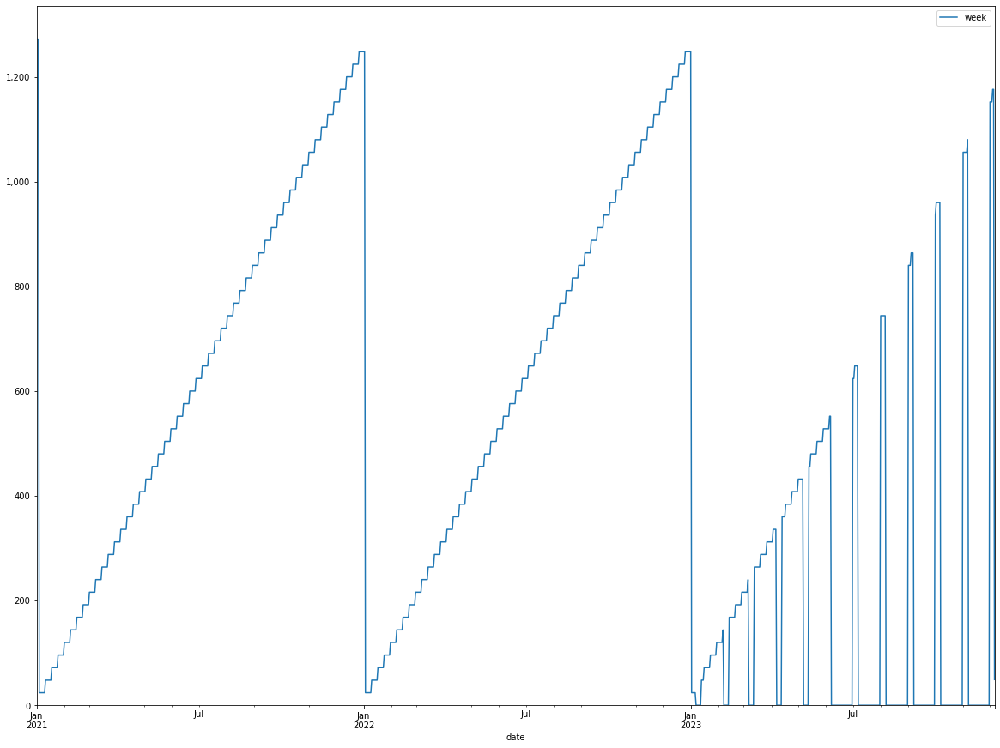

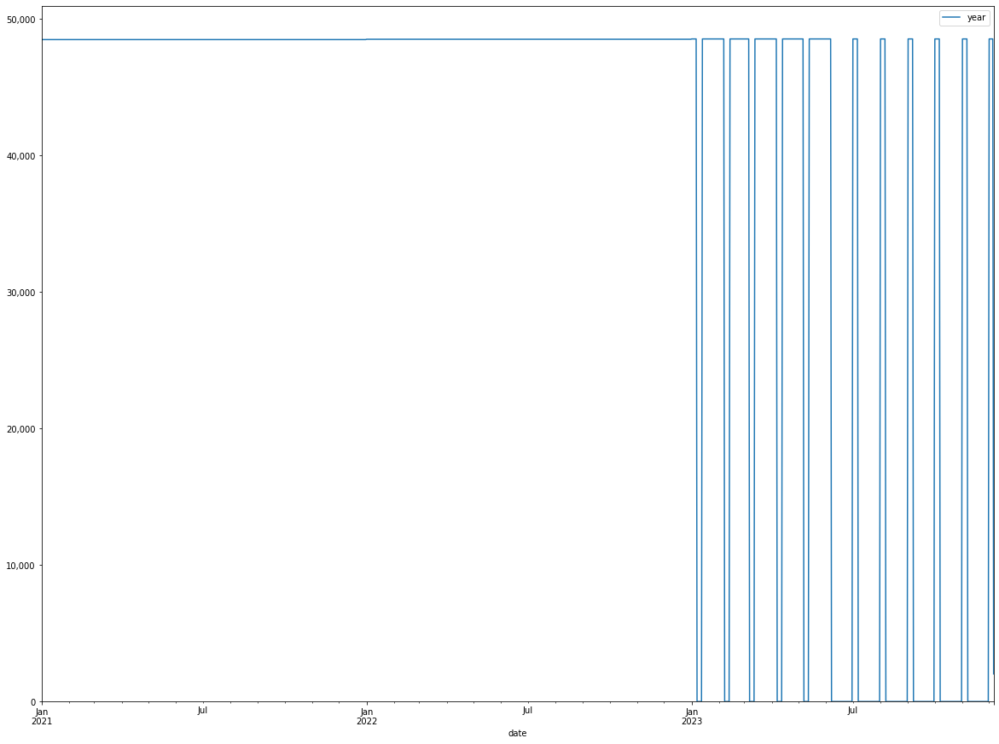

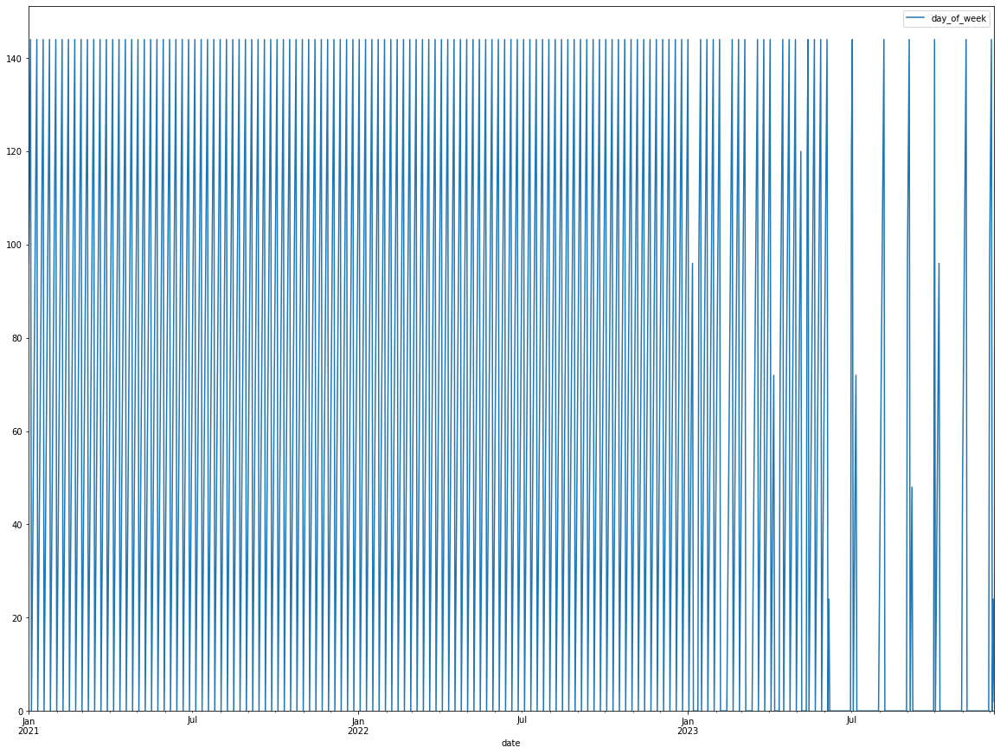

Plotting daily data


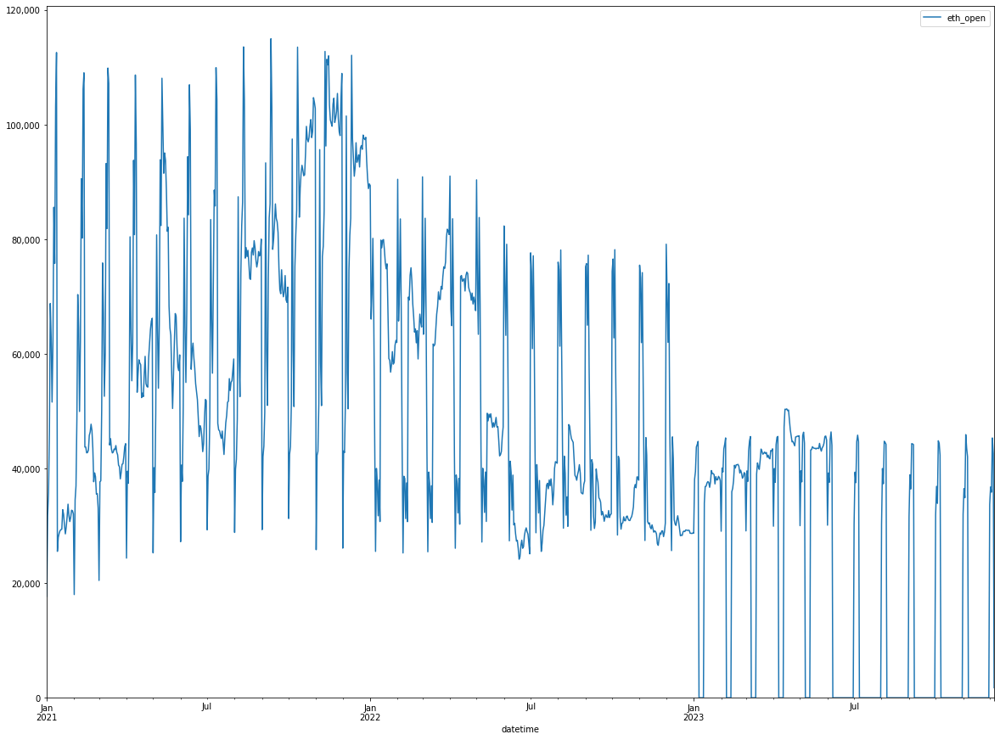

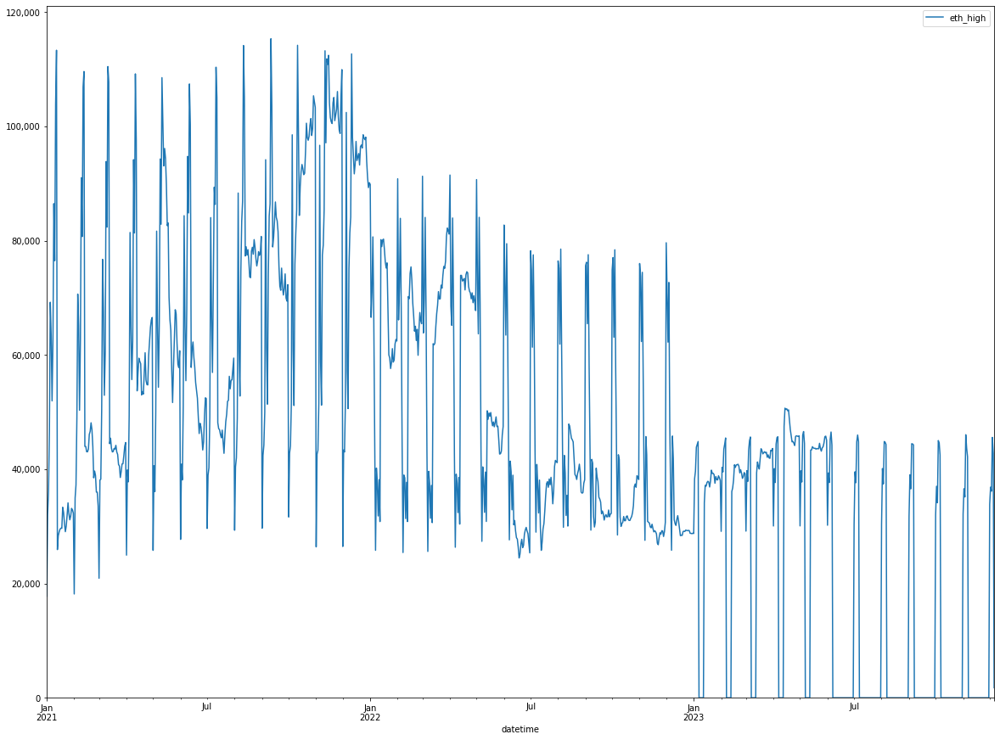

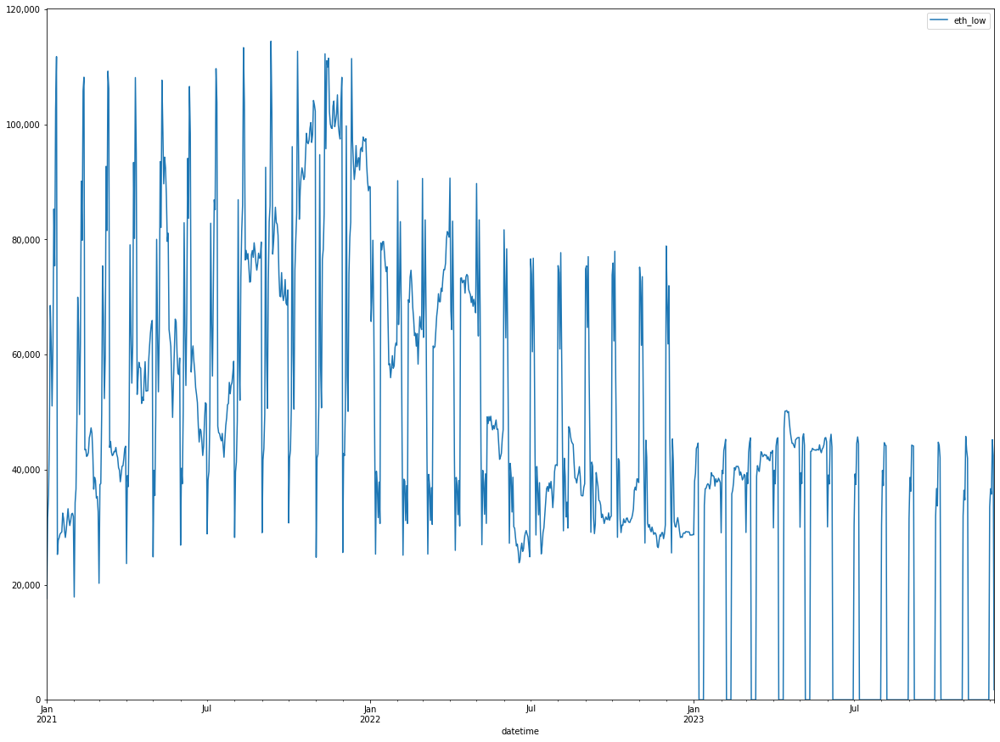

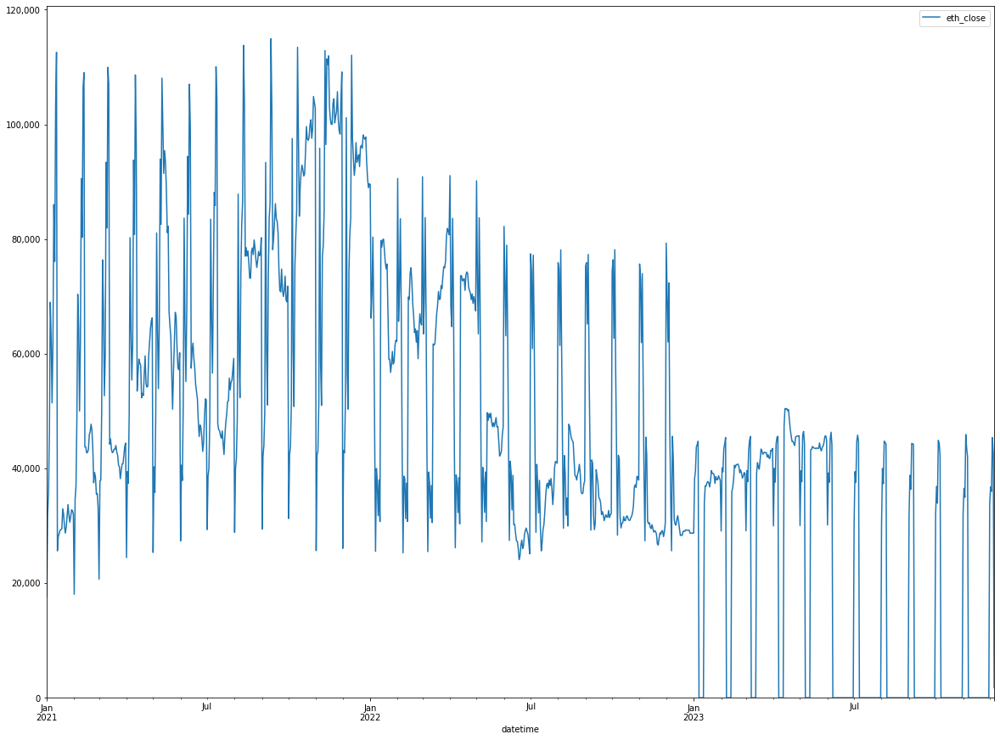

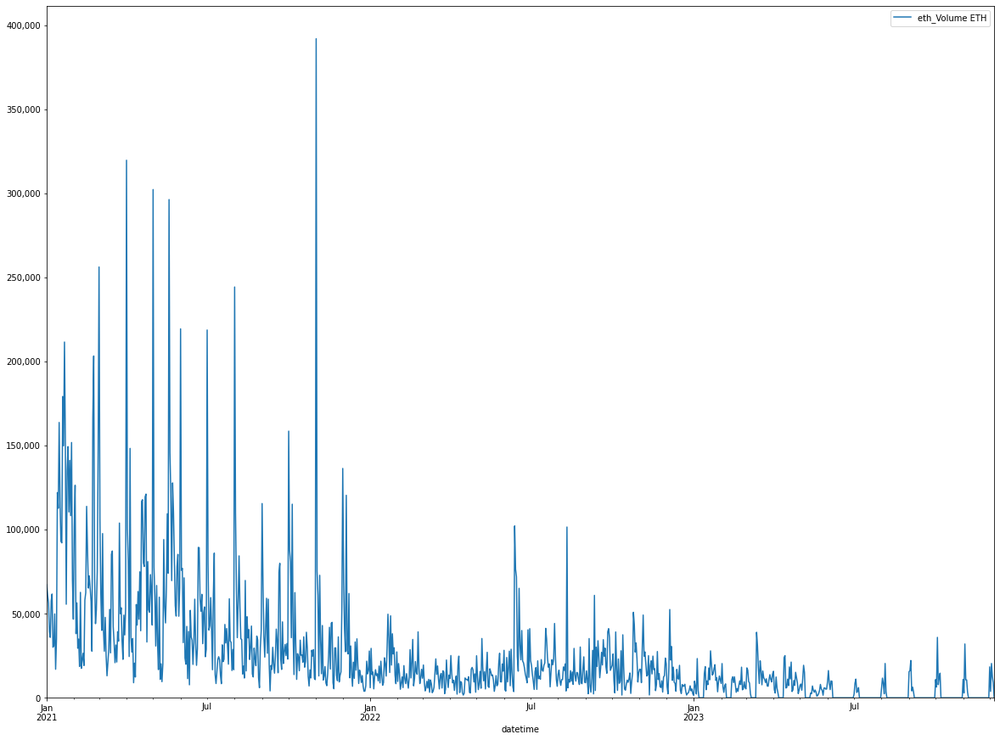

...

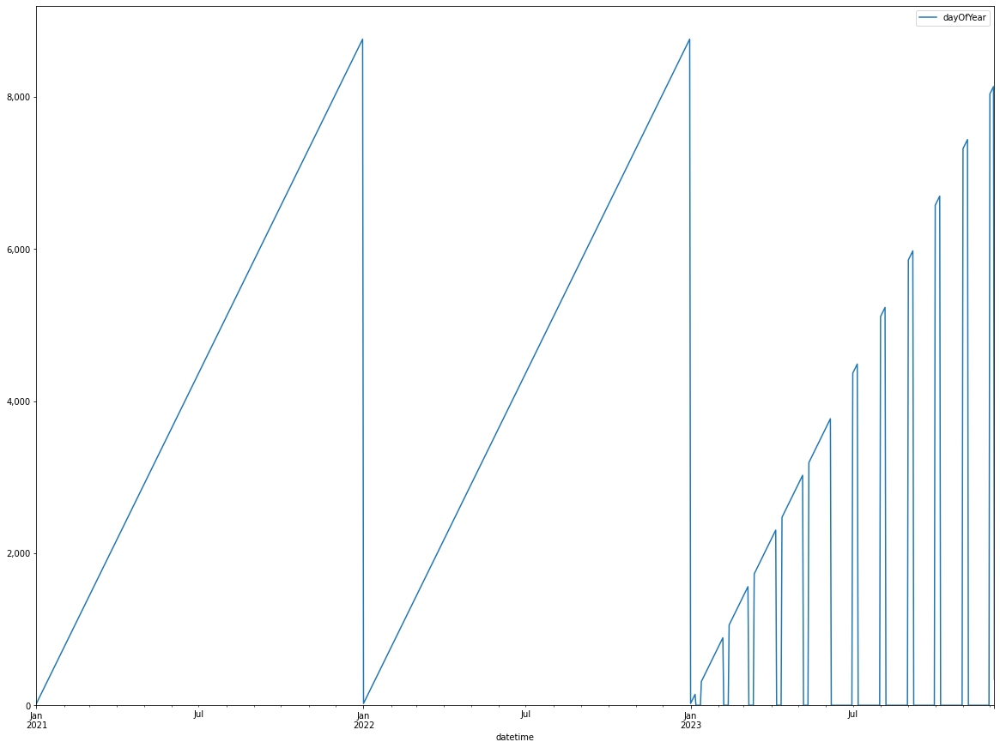

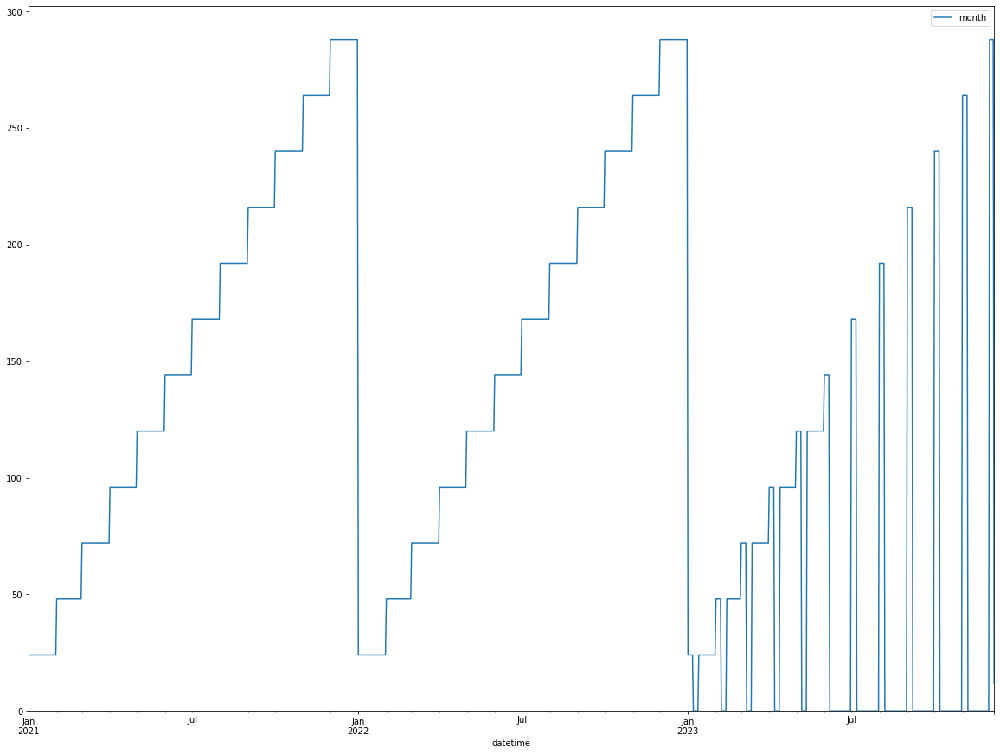

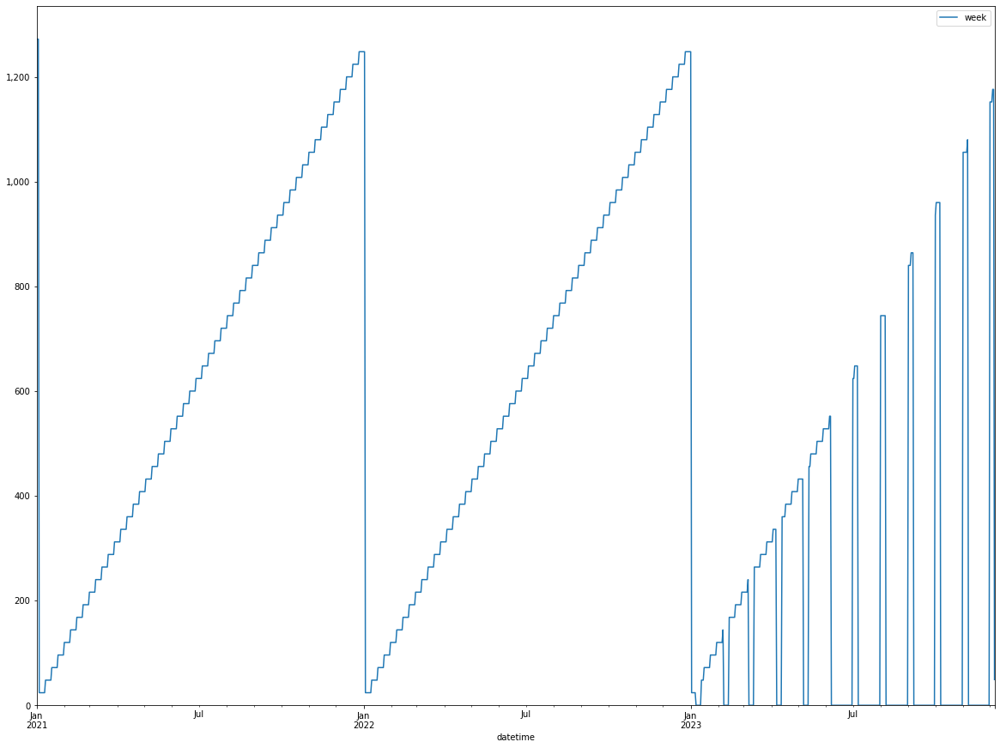

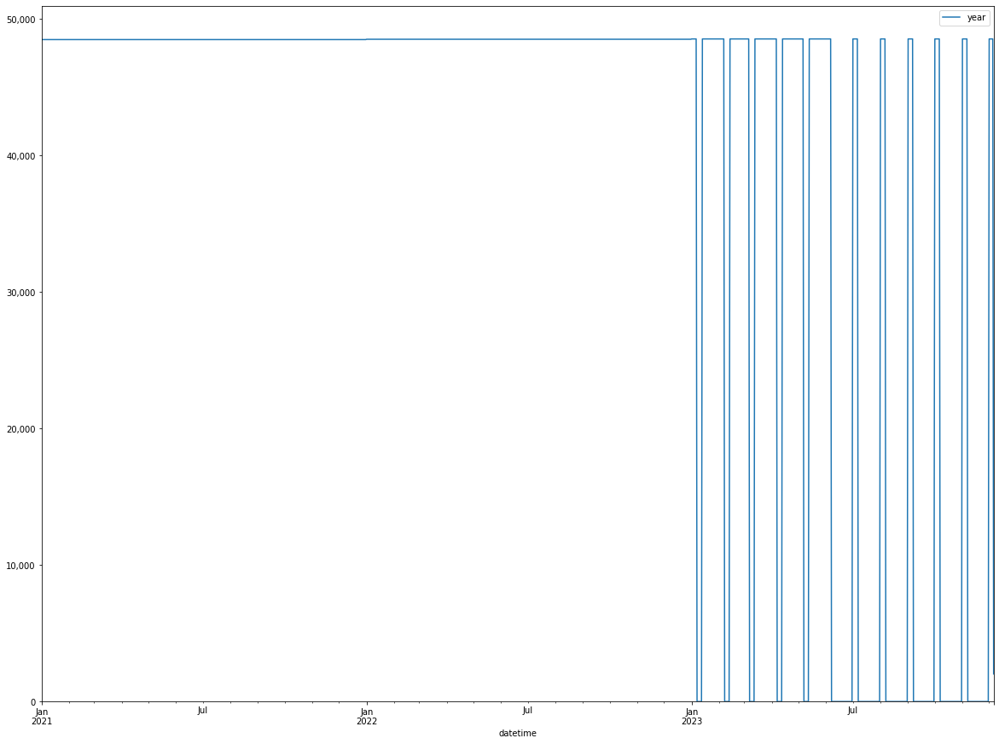

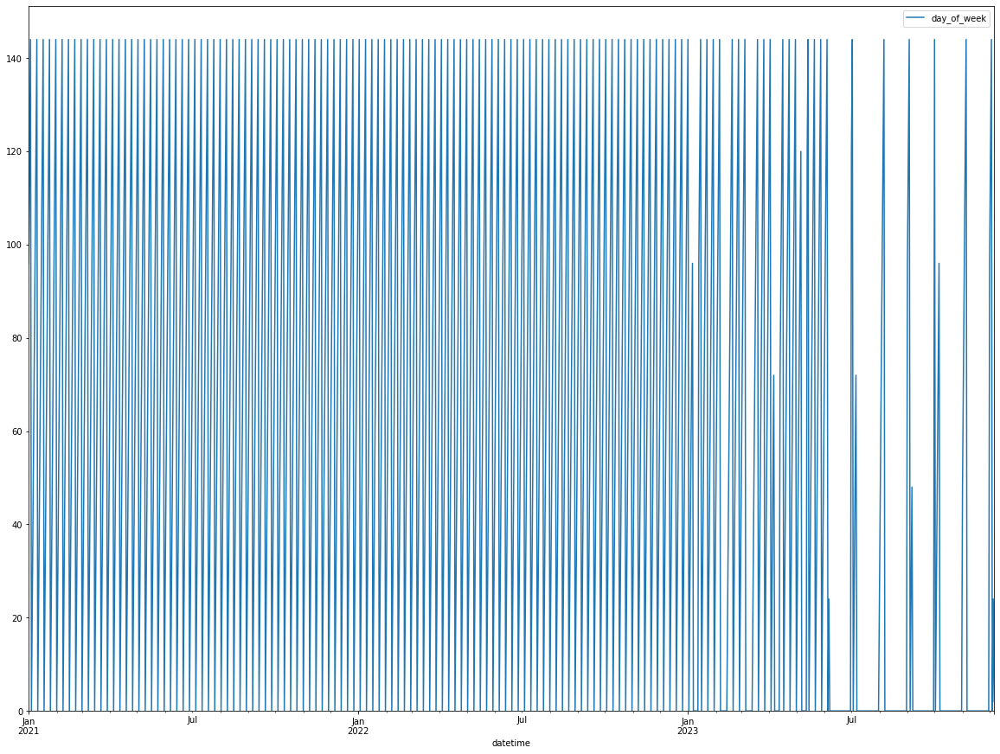

In [ ]:
sels
time_series_plot(selected_years_df)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44491 entries, 0 to 44490
Data columns (total 24 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   eth_date        44491 non-null  datetime64[ns]
 1   eth_open        44491 non-null  float64       
 2   eth_high        44491 non-null  float64       
 3   eth_low         44491 non-null  float64       
 4   eth_close       44491 non-null  float64       
 5   eth_Volume ETH  44491 non-null  float64       
 6   eth_Volume USD  44491 non-null  float64       
 7   btc_open        44491 non-null  float64       
 8   btc_high        44491 non-null  float64       
 9   btc_low         44491 non-null  float64       
 10  btc_close       44491 non-null  float64       
 11  btc_Volume BTC  44491 non-null  float64       
 12  btc_Volume USD  44491 non-null  float64       
 13  date            44491 non-null  datetime64[ns]
 14  minute          44491 non-null  int64         
 15  ho

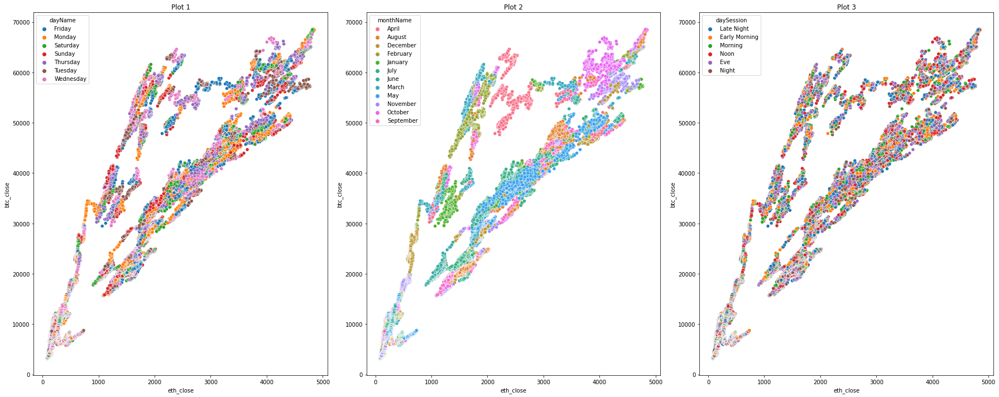

In [ ]:
# Create the subplots
fig, axes = plt.subplots(1, 3, figsize=(25, 10))

# Plot 1
sns.scatterplot(y='btc_close', x='eth_close', hue='dayName', data=df, ax=axes[0])

# Plot 2
sns.scatterplot(y='btc_close', x='eth_close', hue='monthName', data=df, ax=axes[1])

# Plot 3
sns.scatterplot(y='btc_close', x='eth_close', hue='daySession', data=df, ax=axes[2])

# Set the titles for each subplot
axes[0].set_title('Plot 1')
axes[1].set_title('Plot 2')
axes[2].set_title('Plot 3')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()

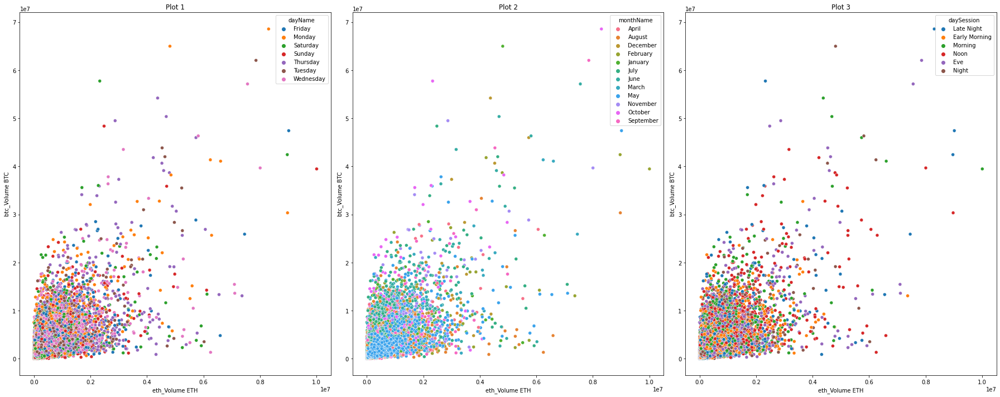

In [ ]:
# Create the subplots
fig, axes = plt.subplots(1, 3, figsize=(25, 10))

# Plot 1
sns.scatterplot(y='btc_Volume BTC', x='eth_Volume ETH', hue='dayName', data=df, ax=axes[0])

# Plot 2
sns.scatterplot(y='btc_Volume BTC', x='eth_Volume ETH', hue='monthName', data=df, ax=axes[1])

# Plot 3
sns.scatterplot(y='btc_Volume BTC', x='eth_Volume ETH', hue='daySession', data=df, ax=axes[2])

# Set the titles for each subplot
axes[0].set_title('Plot 1')
axes[1].set_title('Plot 2')
axes[2].set_title('Plot 3')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()

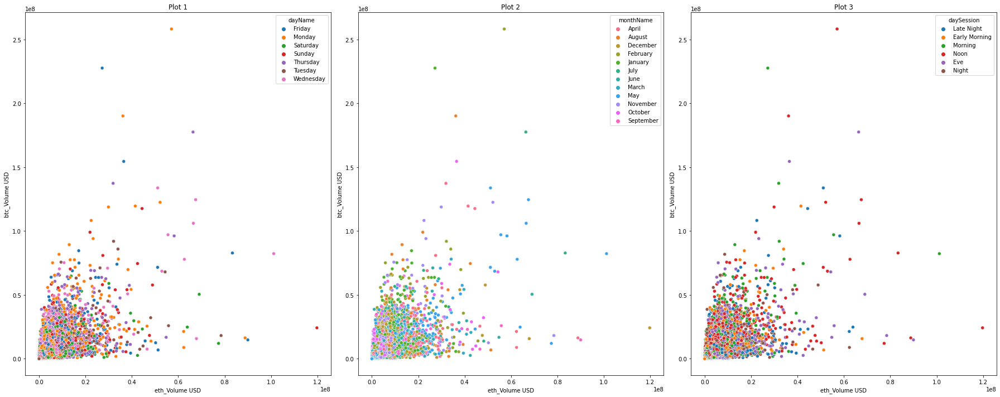

In [ ]:
# Create the subplots
fig, axes = plt.subplots(1, 3, figsize=(25, 10))

# Plot 1
sns.scatterplot(y='btc_Volume USD', x='eth_Volume USD', hue='dayName', data=df, ax=axes[0])

# Plot 2
sns.scatterplot(y='btc_Volume USD', x='eth_Volume USD', hue='monthName', data=df, ax=axes[1])

# Plot 3
sns.scatterplot(y='btc_Volume USD', x='eth_Volume USD', hue='daySession', data=df, ax=axes[2])

# Set the titles for each subplot
axes[0].set_title('Plot 1')
axes[1].set_title('Plot 2')
axes[2].set_title('Plot 3')

# Adjust the spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()

- The similar plot patterns between btc_volume (Bitcoin volume) and eth_volume (Ethereum volume) across different time aggregations indicate that the trading volumes of Bitcoin and Ethereum are also closely related. This suggests that when there is high trading activity or volume in Bitcoin, there is a corresponding increase in trading volume for Ethereum, and vice versa.

The average trading volume of the exhange of 'btc_volume' or 'eth_volume' for days of week with standard error = standard deviation/sqrt(total number of weeks). 

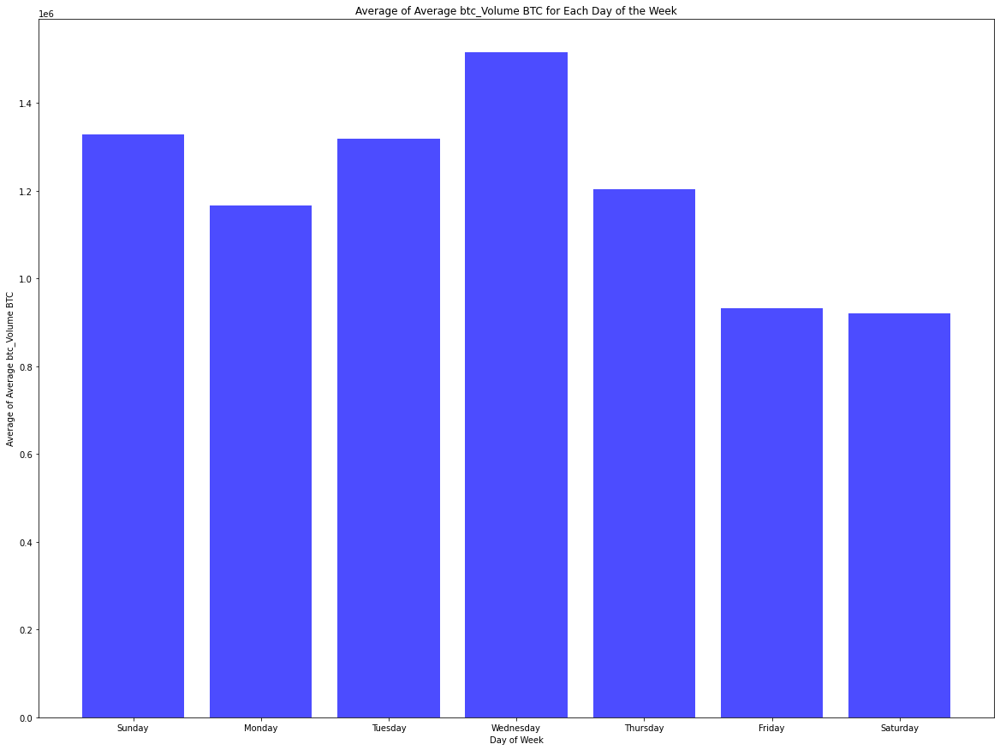

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your dataframe is named 'df'

# Create 'day_of_week' column representing the day of the week (0 for Sunday, 1 for Monday, ..., 6 for Saturday)
df['day_of_week'] = df['eth_date'].dt.dayofweek

# Filter the dataframe based on the given date range
start_date = '2018-05-15 06:00:00'
end_date = '2023-12-06 00:00:00'
filtered_df = df[(df['eth_date'] >= start_date) & (df['eth_date'] <= end_date)]

# Group the filtered dataframe by 'day_of_week' and calculate mean of 'btc_Volume BTC'
grouped = filtered_df.groupby('day_of_week')['btc_Volume BTC'].mean()

# Calculate the average of the means
average_of_averages = grouped.mean()

# Plot the average of the average 'btc_Volume BTC' for each day of the week
day_names = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
x = range(len(day_names))
y = grouped.values

fig, ax = plt.subplots()

# Plot the average of the average 'btc_Volume BTC' as a bar plot
ax.bar(x, y, color='blue', alpha=0.7)

# Set the x-axis labels to the day names
ax.set_xticks(x)
ax.set_xticklabels(day_names)

# Set labels and title
ax.set_xlabel('Day of Week')
ax.set_ylabel('Average of Average btc_Volume BTC')
ax.set_title('Average of Average btc_Volume BTC for Each Day of the Week')

# Display the average of the average 'btc_Volume BTC'
plt.show()


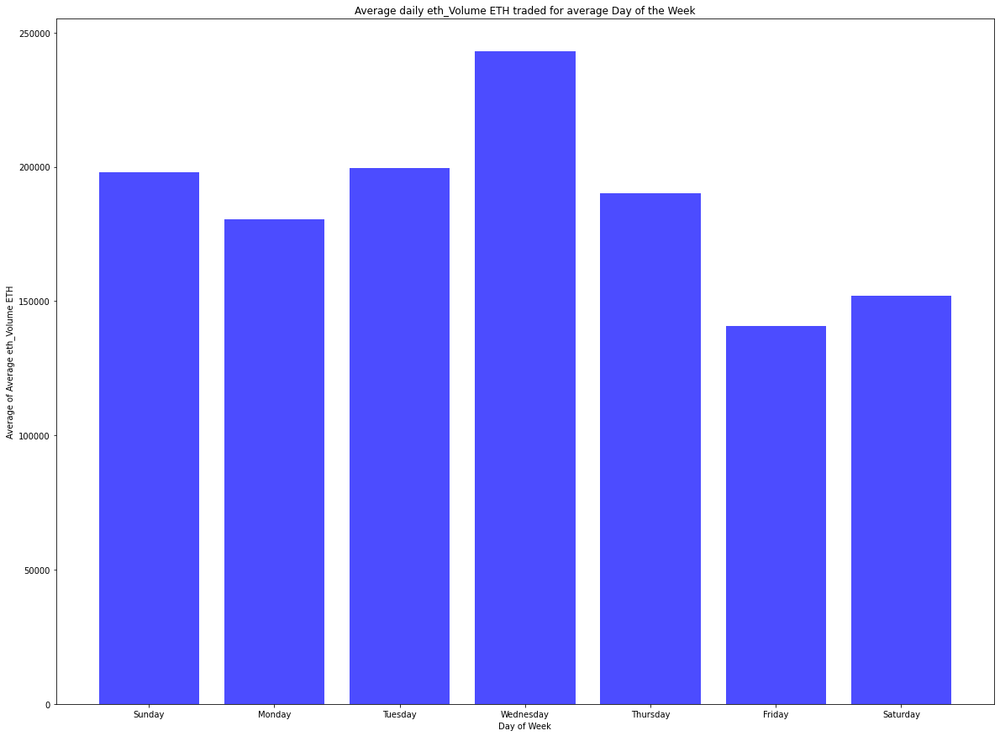

In [ ]:
# Create 'day_of_week' column representing the day of the week (0 for Sunday, 1 for Monday, ..., 6 for Saturday)
df['day_of_week'] = df['eth_date'].dt.dayofweek

# Filter the dataframe based on the given date range
start_date = '2018-05-15 06:00:00'
end_date = '2023-12-06 00:00:00'
filtered_df = df[(df['eth_date'] >= start_date) & (df['eth_date'] <= end_date)]

# Group the filtered dataframe by 'day_of_week' and calculate mean of 'btc_Volume BTC'
grouped = filtered_df.groupby('day_of_week')['eth_Volume ETH'].mean()

# Calculate the average of the means
average_of_averages = grouped.mean()

# Plot the average of the average 'btc_Volume BTC' for each day of the week
day_names = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
x = range(len(day_names))
y = grouped.values

fig, ax = plt.subplots()

# Plot the average of the average 'btc_Volume BTC' as a bar plot
ax.bar(x, y, color='blue', alpha=0.7)

# Set the x-axis labels to the day names
ax.set_xticks(x)
ax.set_xticklabels(day_names)

# Set labels and title
ax.set_xlabel('Day of Week')
ax.set_ylabel('Average of Average eth_Volume ETH')
ax.set_title('Average daily eth_Volume ETH traded for average Day of the Week')

# Display the average of the average 'btc_Volume BTC'
plt.show()


- Tried tracking the possible geo-location from where the trading might happen. 
-  for this devided the timezones ASIA, USA , EUROPE and OTHERS based on their local 9AM-5PM office hours where the maximum possibility of trading tend to happen.

Asia/Kolkata
America/New_York
Europe/London


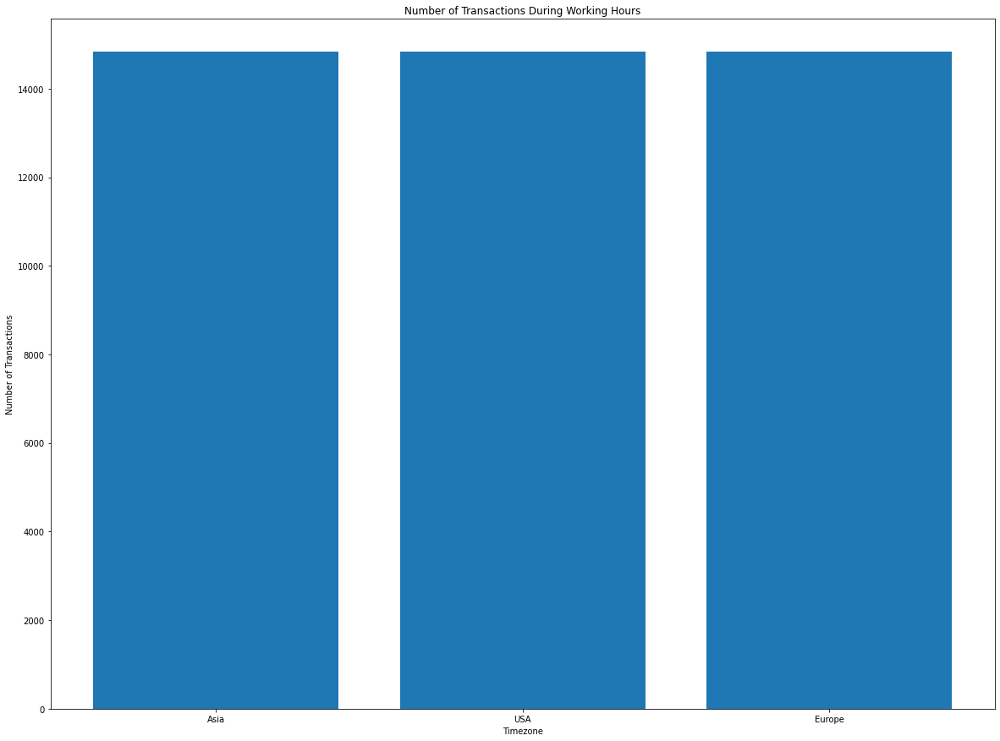

In [ ]:
from pytz import timezone
df['datetime'] = pd.to_datetime(df['eth_date'])

# Define the timezones for Asia, USA, and Europe
asia_tz = timezone('Asia/Kolkata')
print(asia_tz)
usa_tz = timezone('America/New_York')
print(usa_tz)
europe_tz = timezone('Europe/London')
print(europe_tz)

# Convert transaction times to respective local timezones
df['datetime_asia'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(asia_tz)
df['datetime_usa'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(usa_tz)
df['datetime_europe'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(europe_tz)

# Define the working hours for each timezone
working_hours_asia = (9, 17)  # 9:00 AM to 5:00 PM in Asia
working_hours_usa = (9, 17)  # 9:00 AM to 5:00 PM in USA
working_hours_europe = (9, 17)  # 9:00 AM to 5:00 PM in Europe

# Filter transactions within the working hours for each timezone
transactions_asia = df[
    (df['datetime_asia'].dt.hour >= working_hours_asia[0]) &
    (df['datetime_asia'].dt.hour < working_hours_asia[1])
]
transactions_usa = df[
    (df['datetime_usa'].dt.hour >= working_hours_usa[0]) &
    (df['datetime_usa'].dt.hour < working_hours_usa[1])
]
transactions_europe = df[
    (df['datetime_europe'].dt.hour >= working_hours_europe[0]) &
    (df['datetime_europe'].dt.hour < working_hours_europe[1])
]

# Count the number of transactions within the working hours for each timezone
num_transactions_asia = len(transactions_asia)
num_transactions_usa = len(transactions_usa)
num_transactions_europe = len(transactions_europe)

# Create a bar plot
timezones = ['Asia', 'USA', 'Europe']
num_transactions = [num_transactions_asia, num_transactions_usa, num_transactions_europe]

plt.bar(timezones, num_transactions)
plt.xlabel('Timezone')
plt.ylabel('Number of Transactions')
plt.title('Number of Transactions During Working Hours')
plt.show()


In [ ]:
df.columns


Index(['eth_date', 'eth_open', 'eth_high', 'eth_low', 'eth_close',
       'eth_Volume ETH', 'eth_Volume USD', 'btc_open', 'btc_high', 'btc_low',
       'btc_close', 'btc_Volume BTC', 'btc_Volume USD', 'date', 'minute',
       'hour', 'day', 'dayName', 'dayOfYear', 'monthName', 'month', 'week',
       'year', 'daySession', 'day_of_week', 'datetime', 'datetime_asia',
       'datetime_usa', 'datetime_europe'],
      dtype='object')

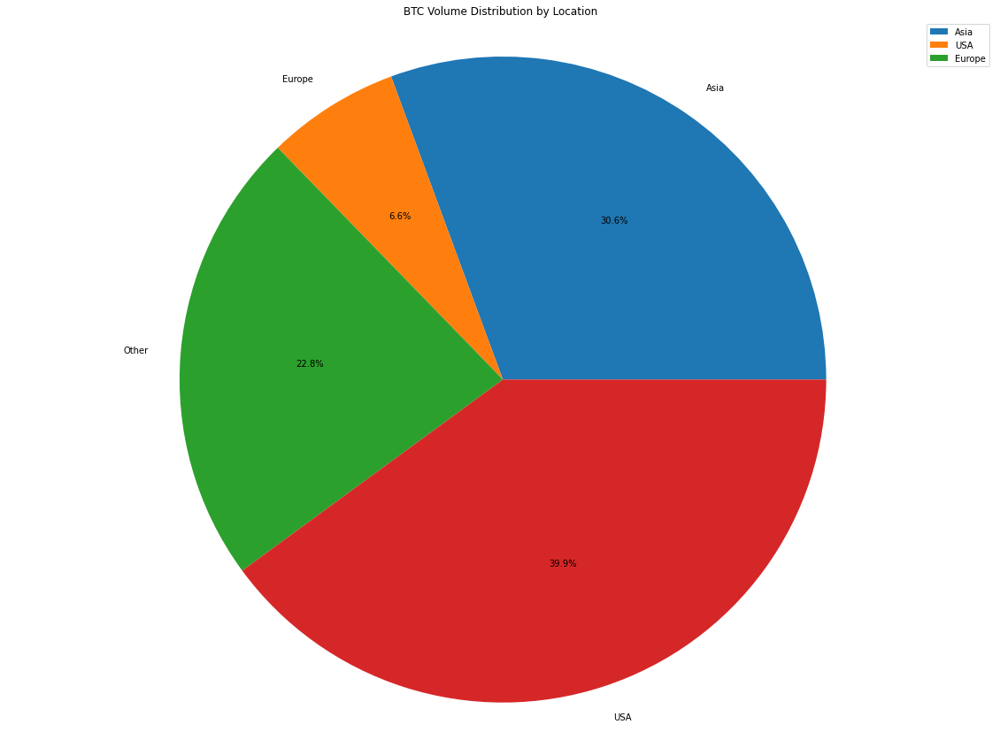

In [ ]:
from pytz import timezone

# Define the timezones for Asia, USA, and Europe
asia_tz = timezone('Asia/Kolkata')
usa_tz = timezone('America/New_York')
europe_tz = timezone('Europe/London')

# Convert transaction times to respective local timezones
df['datetime_asia'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(asia_tz)
df['datetime_usa'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(usa_tz)
df['datetime_europe'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(europe_tz)

# Define the working hours for each timezone
working_hours_asia = (9, 17)  # 9:00 AM to 5:00 PM in Asia
working_hours_usa = (9, 17)  # 9:00 AM to 5:00 PM in USA
working_hours_europe = (9, 17)  # 9:00 AM to 5:00 PM in Europe

# Function to categorize the location based on working hours
def categorize_location(row):
    if row['datetime_asia'].hour in range(*working_hours_asia):
        return 'Asia'
    elif row['datetime_usa'].hour in range(*working_hours_usa):
        return 'USA'
    elif row['datetime_europe'].hour in range(*working_hours_europe):
        return 'Europe'
    else:
        return 'Other'

# Create the location category column
df['Location'] = df.apply(categorize_location, axis=1)

# Calculate the sum of btc_volume BTC for each location
btc_volume_by_location = df.groupby('Location')['btc_Volume BTC'].sum()

# Create a pie chart
plt.pie(btc_volume_by_location.values, labels=btc_volume_by_location.index, autopct='%1.1f%%')
plt.legend(labels=timezones)
plt.title('BTC Volume Distribution by Location')
plt.axis('equal')
plt.show()


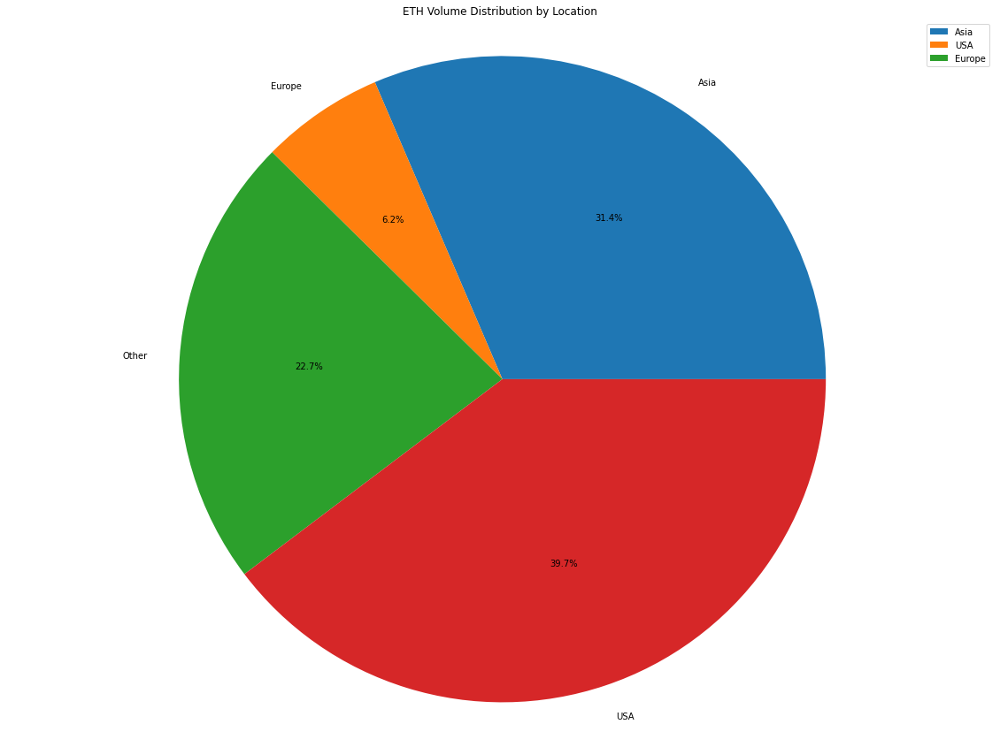

In [ ]:
from pytz import timezone

# Define the timezones for Asia, USA, and Europe
asia_tz = timezone('Asia/Kolkata')
usa_tz = timezone('America/New_York')
europe_tz = timezone('Europe/London')

# Convert transaction times to respective local timezones
df['datetime_asia'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(asia_tz)
df['datetime_usa'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(usa_tz)
df['datetime_europe'] = df['datetime'].dt.tz_localize('UTC').dt.tz_convert(europe_tz)

# Define the working hours for each timezone
working_hours_asia = (9, 17)  # 9:00 AM to 5:00 PM in Asia
working_hours_usa = (9, 17)  # 9:00 AM to 5:00 PM in USA
working_hours_europe = (9, 17)  # 9:00 AM to 5:00 PM in Europe

# Function to categorize the location based on working hours
def categorize_location(row):
    if row['datetime_asia'].hour in range(*working_hours_asia):
        return 'Asia'
    elif row['datetime_usa'].hour in range(*working_hours_usa):
        return 'USA'
    elif row['datetime_europe'].hour in range(*working_hours_europe):
        return 'Europe'
    else:
        return 'Other'

# Create the location category column
df['Location'] = df.apply(categorize_location, axis=1)

# Calculate the sum of btc_volume BTC for each location
btc_volume_by_location = df.groupby('Location')['eth_Volume ETH'].sum()

# Create a pie chart
plt.pie(btc_volume_by_location.values, labels=btc_volume_by_location.index, autopct='%1.1f%%')
plt.legend(labels=timezones)
plt.title('ETH Volume Distribution by Location')
plt.axis('equal')
plt.show()
